In [6]:

import os
import time
import numpy as np
import pandas as pd
import ta  # Install via: pip install ta
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, LSTM, Dense, Concatenate, TimeDistributed,Lambda
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import Huber
from tensorflow.keras.callbacks import EarlyStopping


In [7]:
# Desired date range
start_date_str = "02/01/2018"  # 2nd January 2003 (DD-MM-YYYY)
end_date_str   = "28/02/2025"  # 28th February 2025 (DD-MM-YYYY)
start_date_filter = pd.to_datetime(start_date_str, dayfirst=True)
end_date_filter   = pd.to_datetime(end_date_str, dayfirst=True)
raw_data_dir = "./data"           # Folder with raw CSV files (e.g., AAPL.csv, SPY.csv)
filtered_data_dir = "./filtered_data_lstmgru"

In [8]:


os.makedirs(filtered_data_dir, exist_ok=True)

def calculate_tema(series, window):
    """
    Calculate the Triple Exponential Moving Average (TEMA)
    using the formula: TEMA = 3*EMA1 - 3*EMA2 + EMA3
    where EMA1 = EMA(series, window)
          EMA2 = EMA(EMA1, window)
          EMA3 = EMA(EMA2, window)
    """
    ema1 = ta.trend.EMAIndicator(close=series, window=window, fillna=False).ema_indicator()
    ema2 = ta.trend.EMAIndicator(close=ema1, window=window, fillna=False).ema_indicator()
    ema3 = ta.trend.EMAIndicator(close=ema2, window=window, fillna=False).ema_indicator()
    tema = 3 * ema1 - 3 * ema2 + ema3
    return tema

def process_csv(file_path, filename):
    try:
        # Specific parsing based on filename
        if filename.upper() == "SPY.CSV":
            # SPY.csv is in DD-MM-YYYY format
            df = pd.read_csv(file_path, parse_dates=["Date"], dayfirst=True)
        else:
            # Other files are in YYYY-MM-DD format
            df = pd.read_csv(file_path, parse_dates=["Date"], dayfirst=False)

        # Drop rows where Date could not be parsed
        df.dropna(subset=["Date"], inplace=True)

        # Ensure Date column is datetime and remove timezone info
        df["Date"] = pd.to_datetime(df["Date"], errors="coerce", utc=True).dt.tz_localize(None)

        # Verify we have the necessary columns
        required_columns = ["Close", "High", "Low", "Open", "Volume"]
        missing_columns = [col for col in required_columns if col not in df.columns]
        if missing_columns:
            print(f"Warning: {filename} is missing columns: {missing_columns}")
            return None

        # Print min and max dates for debugging
        print(f"{filename} - Date Range: {df['Date'].min()} to {df['Date'].max()}")

        # Filter for dates between start and end dates
        df_filtered = df[
            (df["Date"] >= start_date_filter) & 
            (df["Date"] <= end_date_filter)
        ].copy()
        
        if df_filtered.empty:
            print(f"Warning: {filename} has no data within the specified date range.")
            return None

        # Retain only essential columns
        df_filtered = df_filtered[["Date", "Open", "High", "Low", "Close", "Volume"]]
        
        # --- Calculate Standard Technical Indicators ---
        for window in [14, 26, 50, 100, 200]:
            df_filtered[f"SMA_{window}"] = ta.trend.SMAIndicator(close=df_filtered["Close"], window=window, fillna=False).sma_indicator()
            df_filtered[f"EMA_{window}"] = ta.trend.EMAIndicator(close=df_filtered["Close"], window=window, fillna=False).ema_indicator()
            df_filtered[f"TEMA_{window}"] = calculate_tema(df_filtered["Close"], window)
        
        # Bollinger Bands (20-day window, std dev=2)
        bb_indicator = ta.volatility.BollingerBands(close=df_filtered["Close"], window=20, window_dev=2, fillna=False)
        df_filtered["BB_Hband"] = bb_indicator.bollinger_hband()
        df_filtered["BB_Mband"] = bb_indicator.bollinger_mavg()
        df_filtered["BB_Lband"] = bb_indicator.bollinger_lband()
        
        # RSI (14-day)
        df_filtered["RSI_14"] = ta.momentum.RSIIndicator(close=df_filtered["Close"], window=14, fillna=False).rsi()
        
        # MACD: using default parameters (fast=12, slow=26, signal=9)
        macd_indicator = ta.trend.MACD(close=df_filtered["Close"], window_slow=26, window_fast=12, window_sign=9, fillna=False)
        df_filtered["MACD"] = macd_indicator.macd()
        df_filtered["MACD_Signal"] = macd_indicator.macd_signal()
        df_filtered["MACD_Hist"] = macd_indicator.macd_diff()
        
        # Derived feature: Mean_HL as the average of High and Low
        df_filtered["Mean_HL"] = (df_filtered["High"] + df_filtered["Low"]) / 2.0
        
        # --- Calculate Extra Relative & Trend-based Indicators ---
        # Relative Momentum (RMom) for a 14-day window
        df_filtered["RMom_14"] = df_filtered["Close"] / df_filtered["Close"].shift(14)
        
        # MomTEMA: ratio of current TEMA to its previous value (offset = 1 day)
        for window in [14, 26, 50, 100, 200]:
            df_filtered[f"MomTEMA_{window}_ofs1"] = df_filtered[f"TEMA_{window}"] / df_filtered[f"TEMA_{window}"].shift(1)
        
        # RCTEMA: ratio of current Close to TEMA for each window
        for window in [14, 26, 50, 100, 200]:
            df_filtered[f"RCTEMA_{window}"] = df_filtered["Close"] / df_filtered[f"TEMA_{window}"]
        
        # MomEMA: ratio of current EMA to its previous value (offset = 1 day)
        for window in [14, 26, 50, 100, 200]:
            df_filtered[f"MomEMA_{window}_ofs1"] = df_filtered[f"EMA_{window}"] / df_filtered[f"EMA_{window}"].shift(1)
        
        # Ratio Indicators for a chosen fast/slow pair (example: 14 vs. 50)
        df_filtered["RTEMA_TEMA_14_50"] = df_filtered["TEMA_14"] / df_filtered["TEMA_50"]
        df_filtered["REMA_EMA_14_50"] = df_filtered["EMA_14"] / df_filtered["EMA_50"]
        df_filtered["RSMA_SMA_14_50"] = df_filtered["SMA_14"] / df_filtered["SMA_50"]
        
        # Relative Volume to SMA: compares current volume to its 20-day SMA
        df_filtered["RVolSMA_20"] = df_filtered["Volume"] / df_filtered["Volume"].rolling(window=20).mean()
        
        # Drop rows with NaN values from indicator calculations
        df_filtered.dropna(inplace=True)
        
        # --- Convert all dates to ISO format (YYYY-MM-DD) ---
        df_filtered["Date"] = df_filtered["Date"].dt.strftime("%Y-%m-%d")
        
        return df_filtered
    
    except Exception as e:
        print(f"Error processing {filename}: {e}")
        return None

# Main processing loop
for filename in os.listdir(raw_data_dir):
    if filename.endswith(".csv"):
        file_path = os.path.join(raw_data_dir, filename)
        
        # Process the file
        processed_df = process_csv(file_path, filename)
        
        # Save if processing was successful
        if processed_df is not None:
            output_path = os.path.join(filtered_data_dir, filename)
            processed_df.to_csv(output_path, index=False)
            print(f"Processed {filename} and saved to {output_path}")

print("Processing complete.")


AAPL.csv - Date Range: 1980-12-12 05:00:00 to 2025-03-03 05:00:00
Processed AAPL.csv and saved to ./filtered_data_lstmgru\AAPL.csv
ABBV.csv - Date Range: 2013-01-02 05:00:00 to 2025-03-03 05:00:00
Processed ABBV.csv and saved to ./filtered_data_lstmgru\ABBV.csv
ADBE.csv - Date Range: 1986-08-13 04:00:00 to 2025-03-03 05:00:00
Processed ADBE.csv and saved to ./filtered_data_lstmgru\ADBE.csv
AMD.csv - Date Range: 1980-03-17 05:00:00 to 2025-03-03 05:00:00
Processed AMD.csv and saved to ./filtered_data_lstmgru\AMD.csv
AMT.csv - Date Range: 1998-02-27 05:00:00 to 2025-03-03 05:00:00
Processed AMT.csv and saved to ./filtered_data_lstmgru\AMT.csv
AMZN.csv - Date Range: 1997-05-15 04:00:00 to 2025-03-03 05:00:00
Processed AMZN.csv and saved to ./filtered_data_lstmgru\AMZN.csv
BA.csv - Date Range: 1962-01-02 05:00:00 to 2025-03-03 05:00:00
Processed BA.csv and saved to ./filtered_data_lstmgru\BA.csv
BAC.csv - Date Range: 1973-02-21 05:00:00 to 2025-03-03 05:00:00
Processed BAC.csv and saved to

In [9]:
# =======================================================
# Part 2: Load Filtered Data and Feature Engineering for Modeling
# =======================================================

def load_csv_data(filepath):
    """Load CSV file and parse the Date column appropriately."""
    df = pd.read_csv(filepath)
    # Use the correct format: ISO format (YYYY-MM-DD)
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")
    df.sort_values("Date", inplace=True)
    return df



def get_model_features(df):
    """
    Return a DataFrame with a fixed set of features.
    Required features:
      - Base: Open, High, Low, Close, Volume
      - Indicators: RSI_14,
                    SMA_14, SMA_26, SMA_50, SMA_100, SMA_200,
                    EMA_14, EMA_26, EMA_50, EMA_100, EMA_200,
                    Bollinger Bands: BB_Hband, BB_Mband, BB_Lband,
                    Derived: Mean_HL
    If any feature is missing, fill with 0.
    """
    desired_features = [
        "Open", "High", "Low", "Close", "Volume",
        "RSI_14",
        "SMA_14", "SMA_26", "SMA_50", "SMA_100", "SMA_200",
        "EMA_14", "EMA_26", "EMA_50", "EMA_100", "EMA_200",
        "BB_Hband", "BB_Mband", "BB_Lband",
        "Mean_HL", "MACD", "MACD_Signal", "MACD_Hist",
        "RMom_14", "MomTEMA_14_ofs1", "MomTEMA_26_ofs1", "MomTEMA_50_ofs1", "MomTEMA_100_ofs1", "MomTEMA_200_ofs1",
        "RCTEMA_14", "RCTEMA_26", "RCTEMA_50", "RCTEMA_100", "RCTEMA_200",
        "MomEMA_14_ofs1", "MomEMA_26_ofs1", "MomEMA_50_ofs1", "MomEMA_100_ofs1", "MomEMA_200_ofs1",
        "RTEMA_TEMA_14_50", "REMA_EMA_14_50", "RSMA_SMA_14_50",
        "RVolSMA_20"
    ]
    for col in desired_features:
        if col not in df.columns:
            df[col] = 0.0
    return df[["Date"] + desired_features].copy()



In [16]:
# # =======================================================
# # Part 3: Sequence Generation and Global Scaling
# # =======================================================
# # We use a sliding window of 20 time steps.
# sequence_length = 20

# def prepare_sequences(df, seq_length):
#     """
#     Generate sequences from the DataFrame (sorted by Date) that contains the fixed set of features.
#     Each sequence has shape (seq_length, num_features) and the target is the next day's Close price.
#     Returns X, y, and seq_dates (as datetime64[ns]).
#     """
#     dates = df["Date"].values
#     df_features = df.drop(columns=["Date"])
#     data_array = df_features.values
#     X, y, seq_dates = [], [], []
#     target_index = df_features.columns.get_loc("Close")
#     for i in range(seq_length, len(data_array)):
#         X.append(data_array[i-seq_length:i])
#         y.append(data_array[i, target_index])
#         seq_dates.append(dates[i])
#     # Ensure the dates are returned as datetime64[ns]
#     seq_dates = np.array(seq_dates, dtype='datetime64[ns]')
#     return np.array(X), np.array(y), seq_dates

# X_list, y_list, dates_list, ticker_list = [], [], [], []
# all_tickers = []

# for filename in os.listdir(filtered_data_dir):
#     if filename.endswith(".csv"):
#         ticker = filename.split(".csv")[0]
#         all_tickers.append(ticker)
#         filepath = os.path.join(filtered_data_dir, filename)
#         df_raw = load_csv_data(filepath)
#         df_feat = get_model_features(df_raw)
#         if len(df_feat) > sequence_length:
#             X, y, seq_dates = prepare_sequences(df_feat, sequence_length)
#             X_list.append(X)
#             y_list.append(y)
#             dates_list.append(seq_dates)
#             ticker_list.extend([ticker] * len(y))

# # Concatenate sequences from all tickers.
# X_all = np.concatenate(X_list, axis=0)
# y_all = np.concatenate(y_list, axis=0)
# dates_all = np.concatenate(dates_list, axis=0)  # Now with dtype datetime64[ns]
# num_features = X_all.shape[2]

# # Fit a global RobustScaler on all feature data.
# scaler = RobustScaler()
# all_data = X_all.reshape(-1, num_features)
# scaler.fit(all_data)

# def scale_sequences(X, scaler):
#     """Scale each sequence using the fitted scaler."""
#     return np.array([scaler.transform(seq) for seq in X])

# X_all_scaled = scale_sequences(X_all, scaler)

# Concatenate sequences from all tickers
X_all = np.concatenate(X_list, axis=0)
y_all = np.concatenate(y_list, axis=0)
dates_all = np.concatenate(dates_list, axis=0)
tickers_all = np.array(ticker_list)

# Scale features using RobustScaler
num_features = X_all.shape[2]
scalers = []

for i in range(num_features):
    scaler = RobustScaler()
    X_all[:, :, i] = scaler.fit_transform(X_all[:, :, i])
    scalers.append(scaler)

# Sort by date before splitting
sorted_indices = np.argsort(dates_all)
X_all = X_all[sorted_indices]
y_all = y_all[sorted_indices]
dates_all = dates_all[sorted_indices]
tickers_all = tickers_all[sorted_indices]

# Train-test split (80-20)
split_idx = int(0.8 * len(X_all))
X_train, X_test = X_all[:split_idx], X_all[split_idx:]
y_train, y_test = y_all[:split_idx], y_all[split_idx:]
dates_train, dates_test = dates_all[:split_idx], dates_all[split_idx:]
tickers_train, tickers_test = tickers_all[:split_idx], tickers_all[split_idx:]

# Final shape and date range output
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("Train date range:", pd.to_datetime(dates_train[0]).date(), "to", pd.to_datetime(dates_train[-1]).date())

print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)
print("Test date range:", pd.to_datetime(dates_test[0]).date(), "to", pd.to_datetime(dates_test[-1]).date())


X_train shape: (31179, 20, 43)
y_train shape: (31179,)
Train date range: 2020-06-17 to 2024-03-19
X_test shape: (7795, 20, 43)
y_test shape: (7795,)
Test date range: 2024-03-19 to 2025-02-28


In [17]:


# =======================================================
# Assumed Preprocessing (should be executed before this snippet)
# =======================================================
# For example:
# X_all_scaled = ...  # shape: (n_samples, sequence_length, num_features)
# y_all = ...         # shape: (n_samples,)
# sequence_length = 20
# num_features = X_all_scaled.shape[2]

# =======================================================
# Part 4: Train-Test Split (Random 80/20 Split)
# =======================================================
# X_train, X_test, y_train, y_test = train_test_split(
#     X_all_scaled, y_all, test_size=0.1, random_state=42,
# )
print("Training samples:", X_train.shape[0])
print("Testing samples:", X_test.shape[0])

# =======================================================
# Setup Distribution Strategy for Parallel Processing
# =======================================================
strategy = tf.distribute.MirroredStrategy()
print("Number of devices: ", strategy.num_replicas_in_sync)

# =======================================================
# Custom Callback for Epoch Timing and Logging Analytics
# =======================================================
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epoch_times = []
        self.train_start_time = time.time()
        print("Training started...")
    def on_epoch_begin(self, epoch, logs=None):
        self.epoch_start_time = time.time()
    def on_epoch_end(self, epoch, logs=None):
        epoch_time = time.time() - self.epoch_start_time
        self.epoch_times.append(epoch_time)
        print(f"Epoch {epoch+1} finished in {epoch_time:.2f} seconds. "
              f"Loss: {logs.get('loss'):.4f}, Val Loss: {logs.get('val_loss'):.4f}")
    def on_train_end(self, logs=None):
        total_time = time.time() - self.train_start_time
        print(f"Training completed in {total_time:.2f} seconds over {len(self.epoch_times)} epochs.")
        avg_epoch_time = np.mean(self.epoch_times)
        print(f"Average time per epoch: {avg_epoch_time:.2f} seconds.")

time_callback = TimeHistory()

Training samples: 31179
Testing samples: 7795
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Number of devices:  1


In [15]:
print(X_test)

[[-0.36540888 -0.36944487 -0.36363703 -0.36661907 -0.23975361  0.16211524
  -0.37111881 -0.36973287 -0.37545207 -0.390204   -0.39028269 -0.36953577
  -0.37003311 -0.37905117 -0.39591912 -0.40301732 -0.38050029 -0.37193087
  -0.35499959 -0.36723574 -0.0377611  -0.05756271  0.05993614  0.15284142
   0.01257596  0.02967769  0.01969218  0.02759724 -0.06487365 -0.02021498
   0.0513513   0.01713402  0.14905525 -0.02509943  0.01973169  0.01202757
  -0.01142263 -0.05875205 -0.08643184  0.03284213 -0.03450449 -0.04351847
  -0.5001066 ]
 [-0.3685383  -0.37430469 -0.38991587 -0.3941451  -0.10569767 -0.98317317
  -0.37240244 -0.37051907 -0.37513481 -0.39013919 -0.39016373 -0.37278897
  -0.37168985 -0.37979383 -0.39619262 -0.40302482 -0.37857916 -0.37301215
  -0.35953321 -0.38267145 -0.13465766 -0.073818   -0.22214864 -0.49139708
  -1.53059124 -1.14295081 -0.8468254  -0.59787429 -0.50151281 -1.64665102
  -1.19936301 -0.91707994 -0.54784816 -0.51277085 -1.08146167 -0.81073851
  -0.60585968 -0.478143

In [18]:
# Example settings: update these based on your data.
sequence_length = 20   # total number of timesteps per sequence
num_features = 43      # number of features per timestep

strategy = tf.distribute.MirroredStrategy()
print("Number of devices:", strategy.num_replicas_in_sync)

with strategy.scope():
    inputs = Input(shape=(sequence_length, num_features))
    
    # Feature extraction for the entire sequence
    x = TimeDistributed(Dense(64, activation='selu'))(inputs)
    
    # Short-term branch: process only the last few timesteps (e.g., last 5)
    short_term = Lambda(lambda x: x[:, -5:, :])(x)
    short_branch = GRU(64, return_sequences=True, recurrent_dropout=0.2)(short_term)
    short_branch = GRU(32, recurrent_dropout=0.1)(short_branch)
    
    # Long-term branch: process the full sequence with an extra hidden LSTM layer
    long_branch = LSTM(128, return_sequences=True, recurrent_dropout=0.2)(x)
    long_branch = LSTM(64, return_sequences=True, recurrent_dropout=0.1)(long_branch)
    long_branch = LSTM(32, recurrent_dropout=0.1)(long_branch)  # Extra hidden layer for better long-term processing
    
    # Merge the outputs from both branches
    merged = Concatenate()([short_branch, long_branch])
    
    # Final Dense layers for prediction
    dense_out = Dense(32, activation='selu')(merged)
    outputs = Dense(1)(dense_out)
    
    model = Model(inputs=inputs, outputs=outputs)
    
    model.compile(optimizer=Adam(learning_rate=5e-4),
                  loss=Huber(delta=1.5),
                  metrics=["mae"])

    

early_stop = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

# Assuming X_train, y_train, X_test, y_test, and time_callback are defined elsewhere
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=16,
    validation_split=0.2,
    callbacks=[early_stop, time_callback]
)

loss, mae = model.evaluate(X_test, y_test)
print("Test Loss:", loss)
print("Test MAE:", mae)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Number of devices: 1

Training started...
Epoch 1/100
Epoch 1 finished in 201.10 seconds. Loss: 70.8482, Val Loss: 21.8233101ms/step - loss: 134.6664 - mae: 90.5062  
1559/1559 ━━━━━━━━━━━━━━━━━━━━ 201s 116ms/step - loss: 134.6255 - mae: 90.4789 - val_loss: 21.8233 - val_mae: 15.2085
Epoch 2/100
Epoch 2 finished in 159.81 seconds. Loss: 11.0980, Val Loss: 7.7466 94ms/step - loss: 13.6470 - mae: 9.7675    
1559/1559 ━━━━━━━━━━━━━━━━━━━━ 160s 102ms/step - loss: 13.6454 - mae: 9.7665 - val_loss: 7.7466 - val_mae: 5.8009
Epoch 3/100
Epoch 3 finished in 153.64 seconds. Loss: 6.3054, Val Loss: 4.7514m 91ms/step - loss: 6.5474 - mae: 5.0249  
1559/1559 ━━━━━━━━━━━━━━━━━━━━ 154s 98ms/step - loss: 6.5472 - mae: 5.0248 - val_loss: 4.7514 - val_mae: 3.7929
Epoch 4/100
Epoch 4 finished in 153.96 seconds. Loss: 5.2929, Val Loss: 5.3014m 92ms/step - loss: 5.4713 - mae: 4.3038  
1559/1559 ━━━━━━━━━━━

In [19]:
model.save("trained_model_lstmgru.keras") 

244/244 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step
Test MAE: 5.3056
Test MSE: 323.6406
Test R² Score: 0.9913
Test Maximum Error: 211.2131
Test MAPE: 1.64%


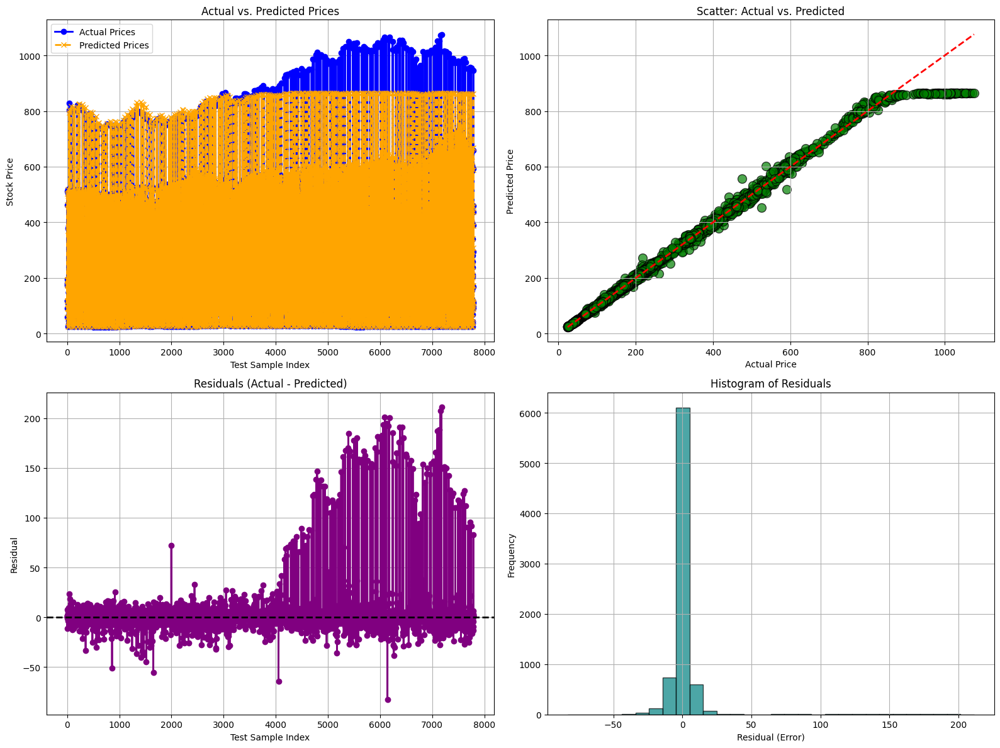

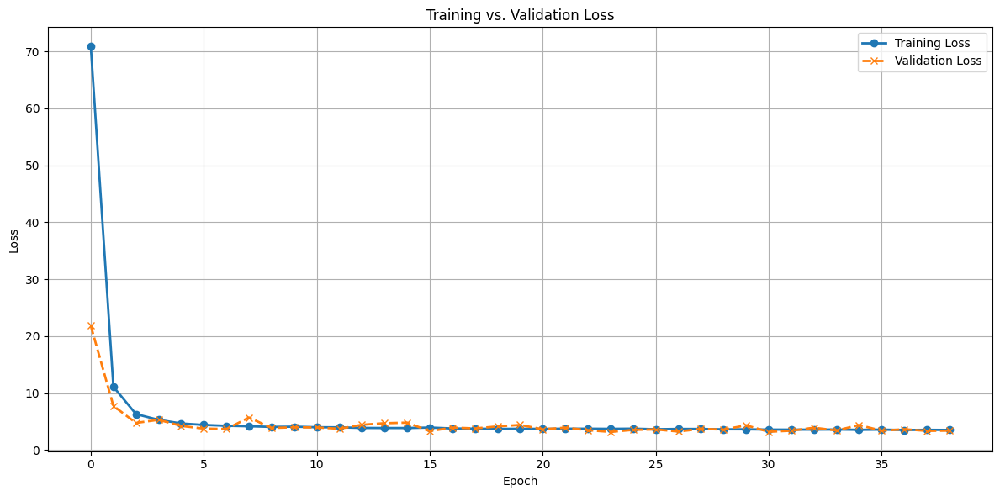

In [20]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, max_error
import numpy as np

# --- 1. Generate Predictions ---
y_pred = model.predict(X_test).flatten()  # Ensure predictions are 1D

# --- 2. Compute Testing Metrics ---
mae_value = mean_absolute_error(y_test, y_pred)
mse_value = mean_squared_error(y_test, y_pred)
r2_value = r2_score(y_test, y_pred)
max_err_value = max_error(y_test, y_pred)

# Compute MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    # Avoid division by zero by replacing zeros with 1 (or handle differently as needed)
    return np.mean(np.abs((y_true - y_pred) / np.where(y_true == 0, 1, y_true))) * 100

mape_value = mean_absolute_percentage_error(y_test, y_pred)

print(f"Test MAE: {mae_value:.4f}")
print(f"Test MSE: {mse_value:.4f}")
print(f"Test R² Score: {r2_value:.4f}")
print(f"Test Maximum Error: {max_err_value:.4f}")
print(f"Test MAPE: {mape_value:.2f}%")

# --- 3. Create Combined Visualizations ---
# (Not using seaborn styles; using default matplotlib style)

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# 3.1 Line Plot: Actual vs. Predicted Prices
axs[0, 0].plot(y_test, label="Actual Prices", color="blue", marker="o", linestyle="-", linewidth=2)
axs[0, 0].plot(y_pred, label="Predicted Prices", color="orange", marker="x", linestyle="--", linewidth=2)
axs[0, 0].set_title("Actual vs. Predicted Prices")
axs[0, 0].set_xlabel("Test Sample Index")
axs[0, 0].set_ylabel("Stock Price")
axs[0, 0].legend()
axs[0, 0].grid(True)

# 3.2 Scatter Plot: Actual vs. Predicted Prices
axs[0, 1].scatter(y_test, y_pred, color="green", alpha=0.7, edgecolor="black", s=100)
axs[0, 1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], "r--", linewidth=2)
axs[0, 1].set_title("Scatter: Actual vs. Predicted")
axs[0, 1].set_xlabel("Actual Price")
axs[0, 1].set_ylabel("Predicted Price")
axs[0, 1].grid(True)

# 3.3 Residual Plot (Errors: Actual - Predicted)
residuals = y_test - y_pred
axs[1, 0].plot(residuals, color="purple", marker="o", linestyle="-", linewidth=2)
axs[1, 0].axhline(0, color="black", linestyle="--", linewidth=2)
axs[1, 0].set_title("Residuals (Actual - Predicted)")
axs[1, 0].set_xlabel("Test Sample Index")
axs[1, 0].set_ylabel("Residual")
axs[1, 0].grid(True)

# 3.4 Histogram of Residuals
axs[1, 1].hist(residuals, bins=30, color="teal", edgecolor="black", alpha=0.7)
axs[1, 1].set_title("Histogram of Residuals")
axs[1, 1].set_xlabel("Residual (Error)")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

# --- 4. Optional: Training vs. Validation Loss Plot ---
# (Requires that you have a 'history' object returned from model.fit())
if "history" in globals():
    plt.figure(figsize=(12, 6))
    plt.plot(history.history["loss"], label="Training Loss", marker="o", linestyle="-", linewidth=2)
    plt.plot(history.history["val_loss"], label="Validation Loss", marker="x", linestyle="--", linewidth=2)
    plt.title("Training vs. Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [17]:
import numpy as np
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    median_absolute_error,
    max_error
)
import math

# -------------------------------
# 1. Overall Regression Metrics
# -------------------------------
mae_value = mean_absolute_error(y_test, y_pred)
mse_value = mean_squared_error(y_test, y_pred)
rmse_value = math.sqrt(mse_value)
r2_value = r2_score(y_test, y_pred)
medae_value = median_absolute_error(y_test, y_pred)
max_err_value = max_error(y_test, y_pred)

def mape(y_true, y_pred):
    # Replace zeros in y_true to avoid division by zero
    return np.mean(np.abs((y_true - y_pred) / np.where(y_true == 0, 1, y_true))) * 100

def smape(y_true, y_pred):
    return 100 / len(y_true) * np.sum(
        2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred) + 1e-8)
    )

mape_value = mape(y_test, y_pred)
smape_value = smape(y_test, y_pred)

print("Overall Regression Metrics:")
print(f"  MAE:    {mae_value:.4f}")
print(f"  MSE:    {mse_value:.4f}")
print(f"  RMSE:   {rmse_value:.4f}")
print(f"  R²:     {r2_value:.4f}")
print(f"  Median AE: {medae_value:.4f}")
print(f"  Max Error: {max_err_value:.4f}")
print(f"  MAPE:   {mape_value:.2f}%")
print(f"  sMAPE:  {smape_value:.2f}%")

# -------------------------------------
# 2. Financial and Directional Metrics
# -------------------------------------
def directional_accuracy(y_true, y_pred):
    # Compare the sign of the change between consecutive values.
    true_diff = np.diff(y_true)
    pred_diff = np.diff(y_pred)
    correct = np.sum(np.sign(true_diff) == np.sign(pred_diff))
    return correct / len(true_diff) * 100

dir_acc = directional_accuracy(y_test, y_pred)
print(f"\nDirectional Accuracy: {dir_acc:.2f}%")

def compute_returns(prices):
    return np.diff(prices) / prices[:-1]

# Compute daily returns from actual and predicted prices.
returns_actual = compute_returns(y_test)
returns_pred = compute_returns(y_pred)

def sharpe_ratio(returns, risk_free_rate=0):
    # Sharpe Ratio: (mean excess return)/(std. deviation of return)
    return np.mean(returns - risk_free_rate) / np.std(returns)

sharpe_actual = sharpe_ratio(returns_actual)
sharpe_pred = sharpe_ratio(returns_pred)
print(f"Actual Sharpe Ratio:    {sharpe_actual:.4f}")
print(f"Predicted Sharpe Ratio: {sharpe_pred:.4f}")

def max_drawdown(prices):
    prices = np.array(prices)
    cumulative_max = np.maximum.accumulate(prices)
    drawdowns = (prices - cumulative_max) / cumulative_max
    return np.min(drawdowns) * 100  # expressed as a percentage

max_dd_actual = max_drawdown(y_test)
max_dd_pred = max_drawdown(y_pred)
print(f"Actual Maximum Drawdown:    {max_dd_actual:.2f}%")
print(f"Predicted Maximum Drawdown: {max_dd_pred:.2f}%")

# -----------------------------
# 3. Segmented Evaluation
# -----------------------------
n = len(y_test)
mid = n // 2
# Temporal Segmentation: First vs. Second Half
y_test_first, y_pred_first = y_test[:mid], y_pred[:mid]
y_test_second, y_pred_second = y_test[mid:], y_pred[mid:]

print("\nTemporal Segmentation Metrics:")
print("  First Half:")
print(f"    MAE:  {mean_absolute_error(y_test_first, y_pred_first):.4f}")
print(f"    MAPE: {mape(y_test_first, y_pred_first):.2f}%")
print("  Second Half:")
print(f"    MAE:  {mean_absolute_error(y_test_second, y_pred_second):.4f}")
print(f"    MAPE: {mape(y_test_second, y_pred_second):.2f}%")

# Volatility-based Segmentation:
# Compute absolute returns as a proxy for volatility.
returns_full = np.abs(np.diff(y_test) / y_test[:-1])
vol_threshold = np.median(returns_full)  # median as threshold

# Adjust indices (returns array is one element shorter)
high_vol_indices = np.where(np.abs(returns_full) >= vol_threshold)[0] + 1
low_vol_indices  = np.where(np.abs(returns_full) < vol_threshold)[0] + 1

if high_vol_indices.size > 0:
    print("\nHigh Volatility Days Metrics:")
    print(f"  MAE:  {mean_absolute_error(y_test[high_vol_indices], y_pred[high_vol_indices]):.4f}")
    print(f"  MAPE: {mape(y_test[high_vol_indices], y_pred[high_vol_indices]):.2f}%")
if low_vol_indices.size > 0:
    print("\nLow Volatility Days Metrics:")
    print(f"  MAE:  {mean_absolute_error(y_test[low_vol_indices], y_pred[low_vol_indices]):.4f}")
    print(f"  MAPE: {mape(y_test[low_vol_indices], y_pred[low_vol_indices]):.2f}%")

# Directional Segmentation:
# Evaluate metrics separately for days when price went up vs. down.
true_diff = np.diff(y_test)
up_indices   = np.where(true_diff > 0)[0] + 1
down_indices = np.where(true_diff < 0)[0] + 1

if up_indices.size > 0:
    print("\nUpward Movement Days Metrics:")
    print(f"  MAE:  {mean_absolute_error(y_test[up_indices], y_pred[up_indices]):.4f}")
    print(f"  MAPE: {mape(y_test[up_indices], y_pred[up_indices]):.2f}%")
if down_indices.size > 0:
    print("\nDownward Movement Days Metrics:")
    print(f"  MAE:  {mean_absolute_error(y_test[down_indices], y_pred[down_indices]):.4f}")
    print(f"  MAPE: {mape(y_test[down_indices], y_pred[down_indices]):.2f}%")


Overall Regression Metrics:
  MAE:    2.7806
  MSE:    25.3675
  RMSE:   5.0366
  R²:     0.9989
  Median AE: 1.4638
  Max Error: 85.2123
  MAPE:   1.68%
  sMAPE:  1.67%

Directional Accuracy: 99.19%
Actual Sharpe Ratio:    0.3186
Predicted Sharpe Ratio: 0.3227
Actual Maximum Drawdown:    -99.12%
Predicted Maximum Drawdown: -99.17%

Temporal Segmentation Metrics:
  First Half:
    MAE:  2.7126
    MAPE: 1.66%
  Second Half:
    MAE:  2.8487
    MAPE: 1.70%

High Volatility Days Metrics:
  MAE:  3.2542
  MAPE: 1.83%

Low Volatility Days Metrics:
  MAE:  2.3075
  MAPE: 1.53%

Upward Movement Days Metrics:
  MAE:  3.8014
  MAPE: 1.44%

Downward Movement Days Metrics:
  MAE:  1.7514
  MAPE: 1.92%


Test date range: 2024-03-19 to 2025-02-28


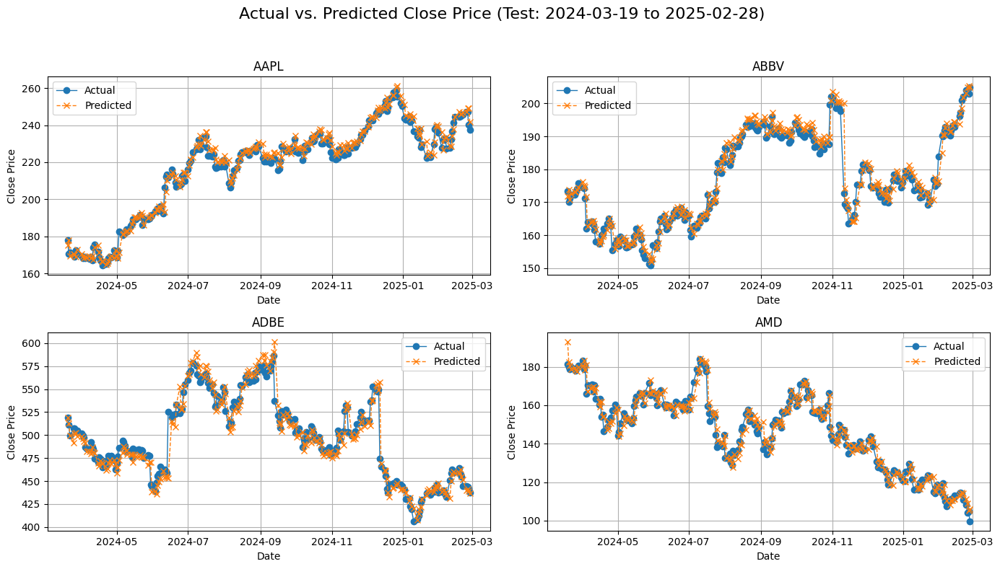

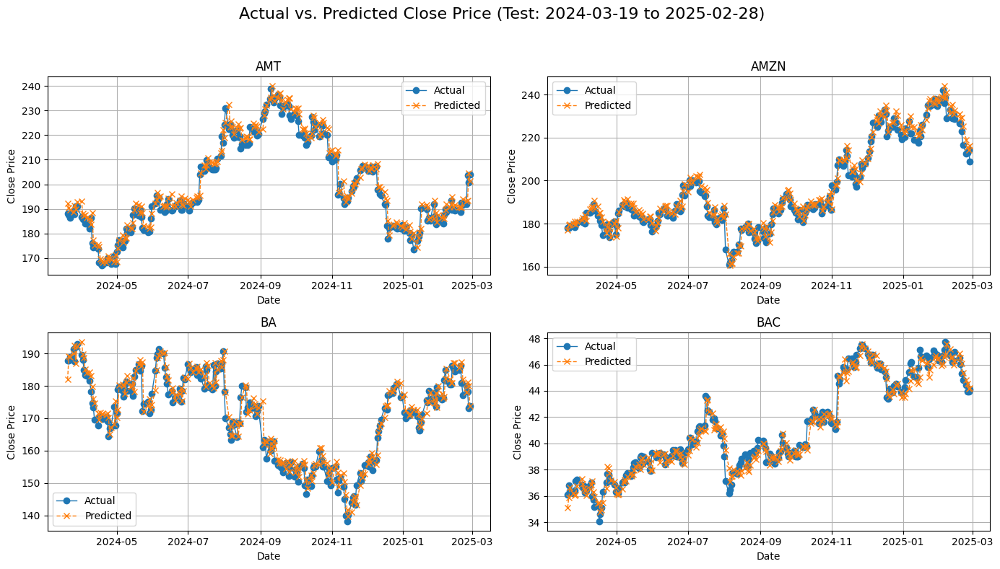

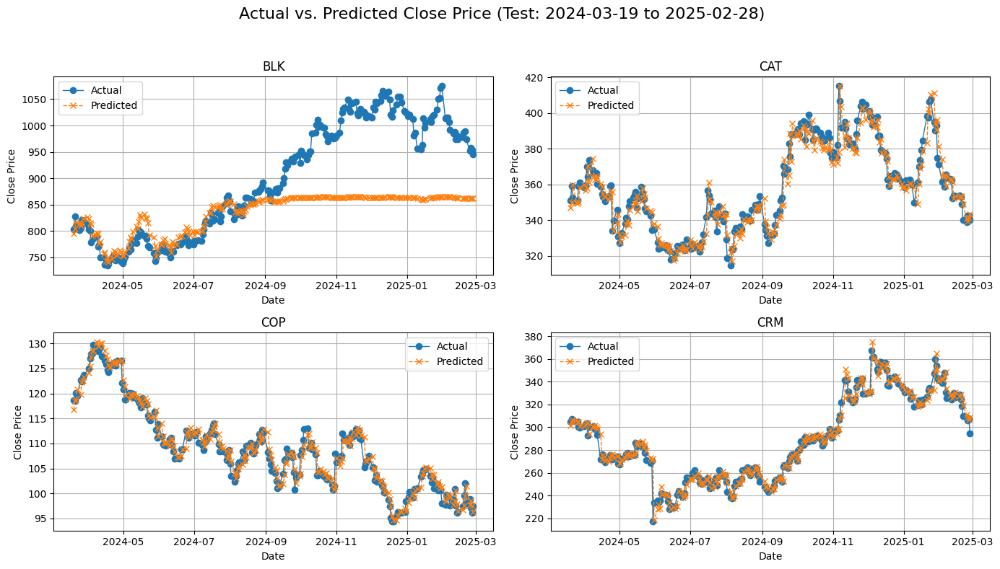

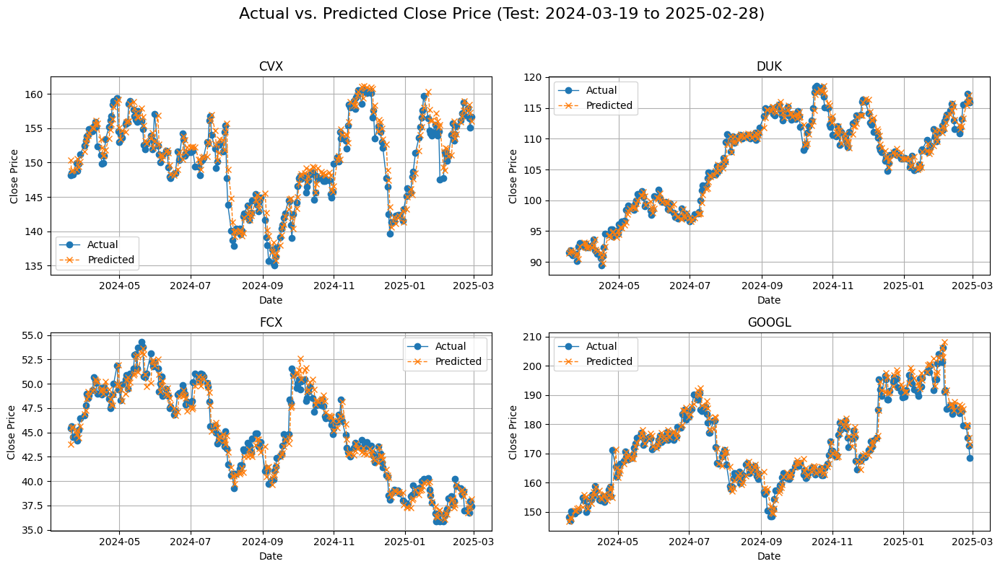

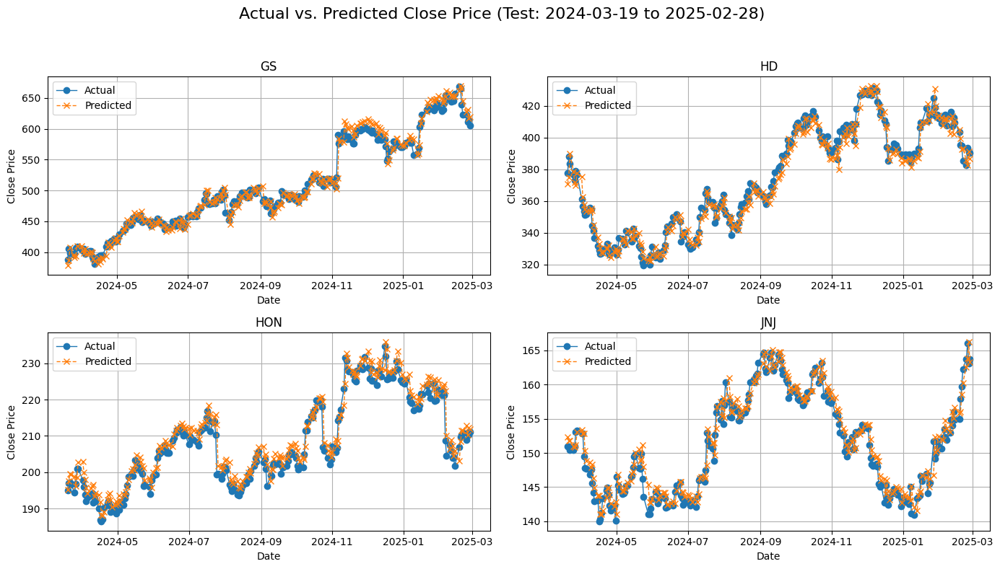

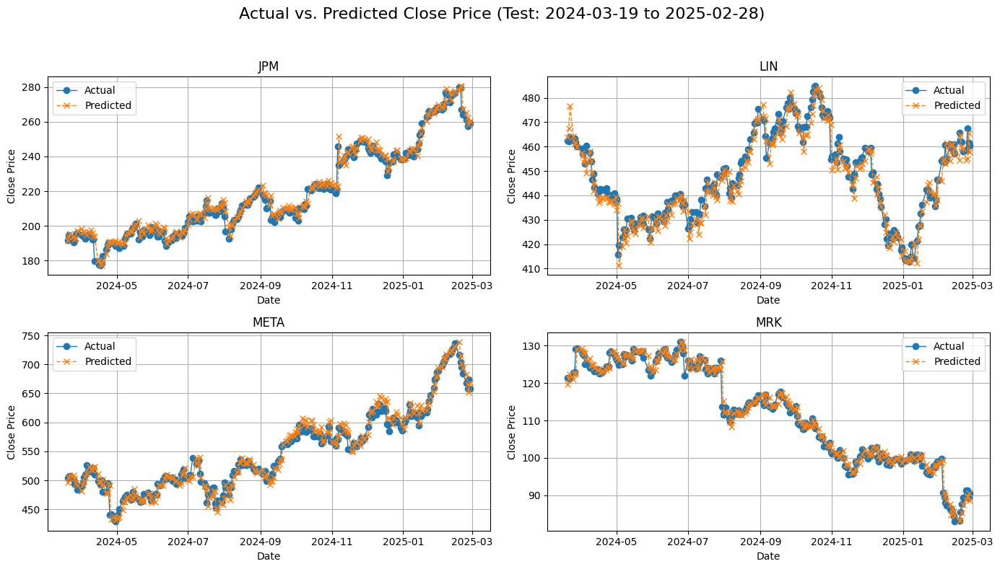

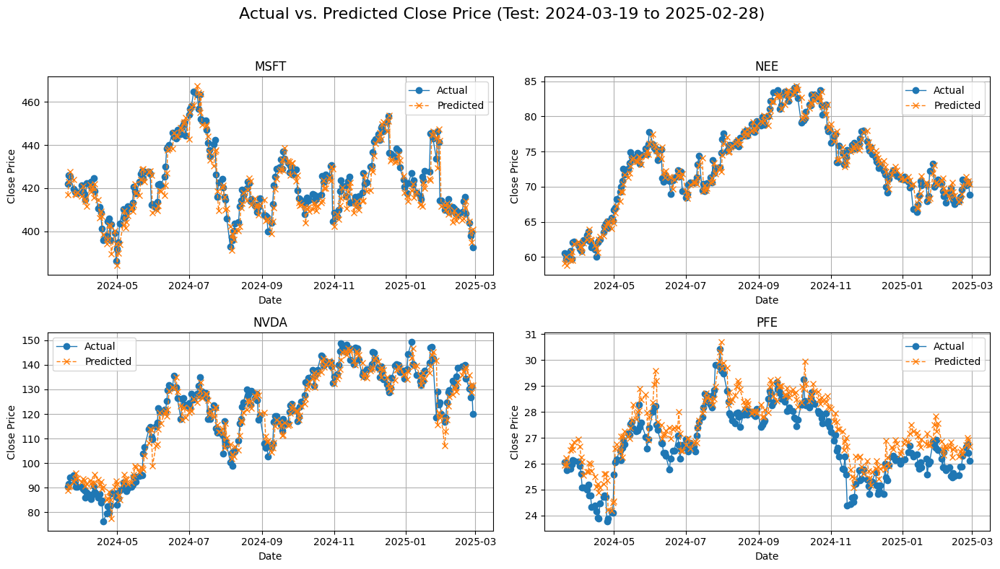

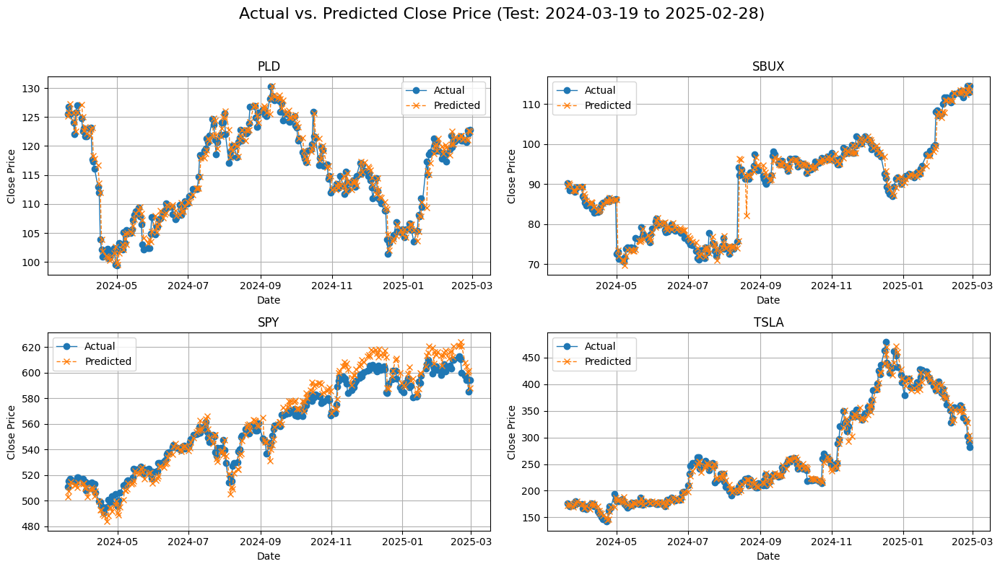

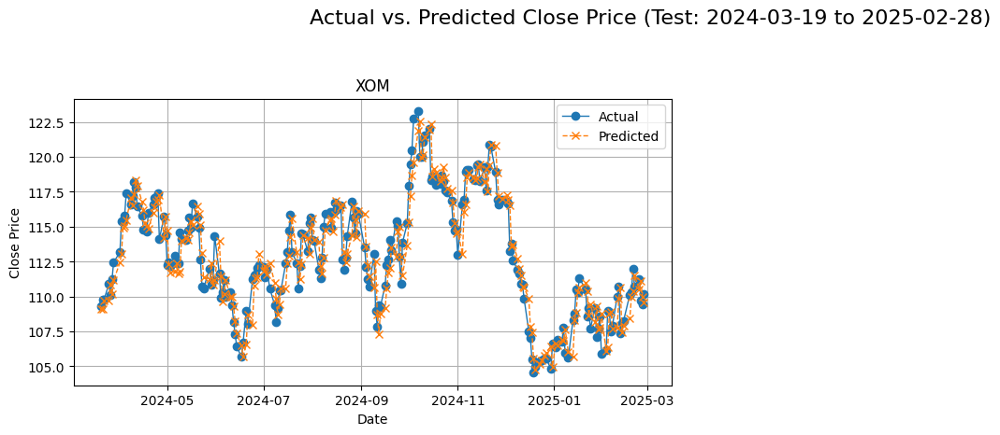

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for the test set with dates, tickers, actual and predicted prices.
df_results = pd.DataFrame({
    "Date": dates_test,      # dates_test: the dates corresponding to X_test samples
    "Ticker": tickers_test,  # tickers_test: the ticker for each test sample
    "Actual": y_test,        # Actual Close Price from the test set
    "Predicted": y_pred      # Predicted Close Price from the model, already flattened
})

# Ensure the Date column is in datetime format.
df_results["Date"] = pd.to_datetime(df_results["Date"])

# Sort the DataFrame by Ticker and Date.
df_results = df_results.sort_values(by=["Ticker", "Date"])

# List the unique tickers in the test data.
unique_tickers = df_results["Ticker"].unique()

# Print the test date range for verification.
print("Test date range:", df_results["Date"].min().date(), "to", df_results["Date"].max().date())

# Set grid dimensions (2 rows x 2 columns = 4 plots per figure)
n_rows, n_cols = 2, 2
plots_per_fig = n_rows * n_cols

# Loop through the tickers, grouping 4 per figure.
for i in range(0, len(unique_tickers), plots_per_fig):
    # Create subplots for this set of tickers.
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 8))
    fig.suptitle("Actual vs. Predicted Close Price (Test: 2024-03-19 to 2025-02-28)", fontsize=16)
    
    # Flatten axes for easier indexing if necessary.
    axes = axes.flatten()

    # Get the current group of tickers.
    tickers_subset = unique_tickers[i:i+plots_per_fig]
    
    # Loop over each ticker in the current group.
    for j, ticker in enumerate(tickers_subset):
        ax = axes[j]
        # Filter the DataFrame for the given ticker.
        df_ticker = df_results[df_results["Ticker"] == ticker].sort_values(by="Date")
        
        # Plot Actual vs. Predicted Close Prices.
        ax.plot(df_ticker["Date"], df_ticker["Actual"], label="Actual", marker="o", linewidth=1)
        ax.plot(df_ticker["Date"], df_ticker["Predicted"], label="Predicted", linestyle="--", marker="x", linewidth=1)
        ax.set_title(ticker)
        ax.set_xlabel("Date")
        ax.set_ylabel("Close Price")
        ax.legend()
        ax.grid(True)
    
    # Remove any unused subplots in this figure.
    for k in range(len(tickers_subset), plots_per_fig):
        fig.delaxes(axes[k])
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the suptitle
    plt.show()


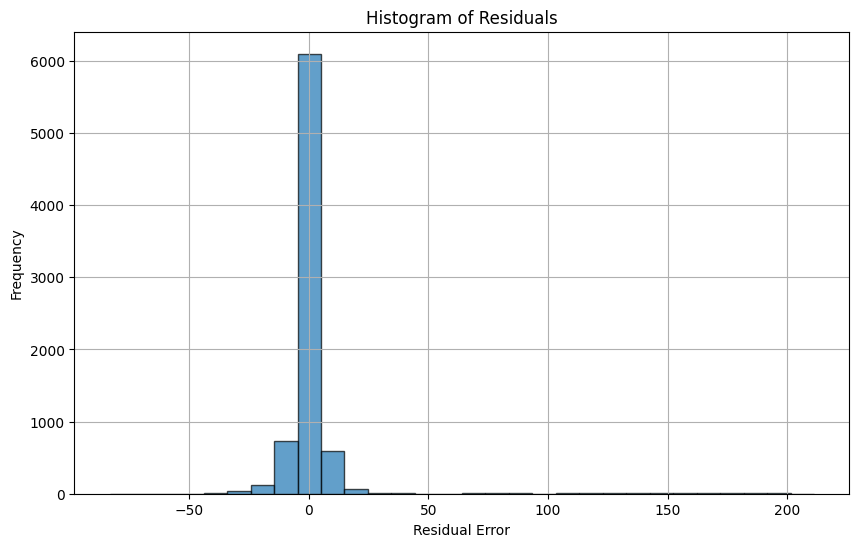

In [27]:
import matplotlib.pyplot as plt

# Calculate residuals: Actual - Predicted
residuals = df_results["Actual"] - df_results["Predicted"]

plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=30, edgecolor="black", alpha=0.7)
plt.title("Histogram of Residuals")
plt.xlabel("Residual Error")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


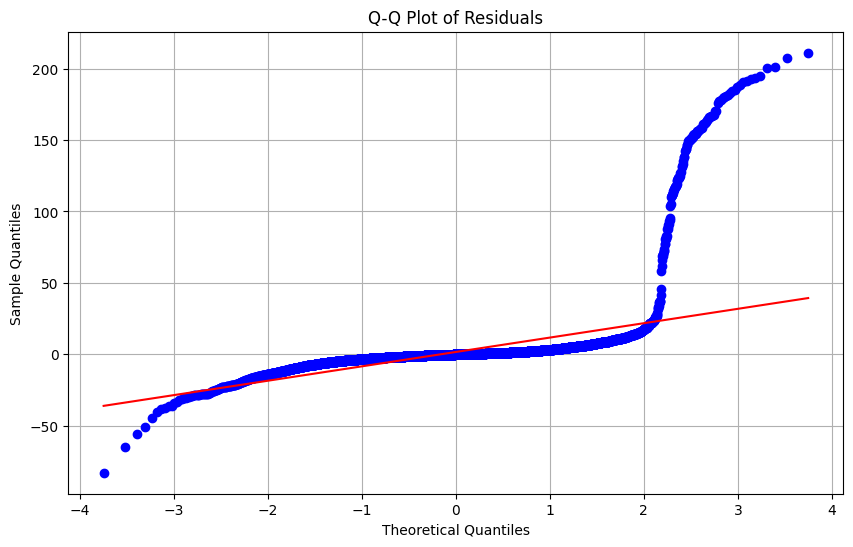

In [28]:
import scipy.stats as stats

plt.figure(figsize=(10, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.grid(True)
plt.show()


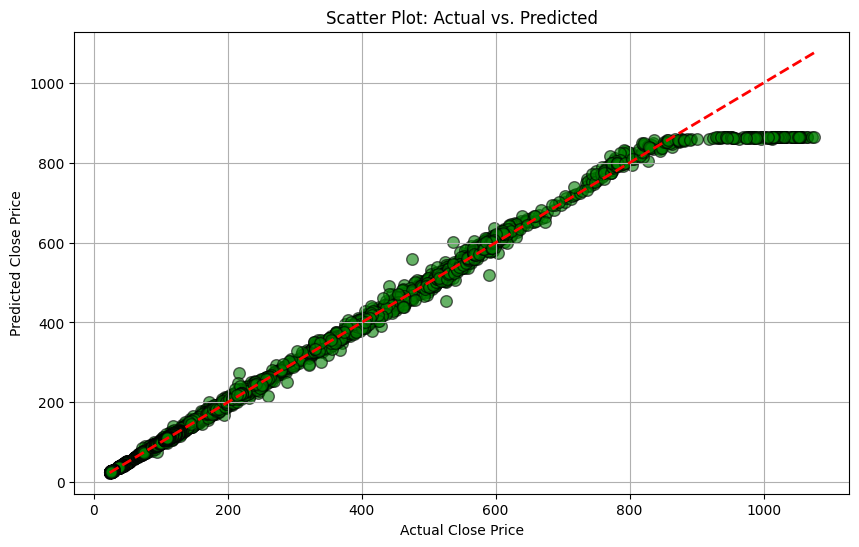

In [29]:
import numpy as np

plt.figure(figsize=(10, 6))
plt.scatter(df_results["Actual"], df_results["Predicted"], color="green", alpha=0.6, edgecolor="black", s=70)
min_val = min(df_results["Actual"].min(), df_results["Predicted"].min())
max_val = max(df_results["Actual"].max(), df_results["Predicted"].max())
plt.plot([min_val, max_val], [min_val, max_val], "r--", linewidth=2)
plt.title("Scatter Plot: Actual vs. Predicted")
plt.xlabel("Actual Close Price")
plt.ylabel("Predicted Close Price")
plt.grid(True)
plt.show()


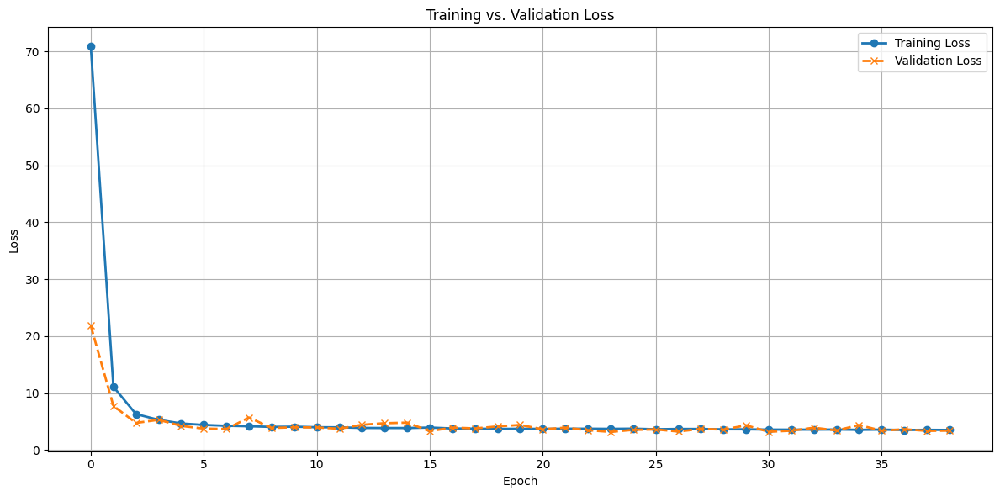

In [30]:
plt.figure(figsize=(12, 6))
plt.plot(history.history["loss"], label="Training Loss", marker="o", linestyle="-", linewidth=2)
plt.plot(history.history["val_loss"], label="Validation Loss", marker="x", linestyle="--", linewidth=2)
plt.title("Training vs. Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


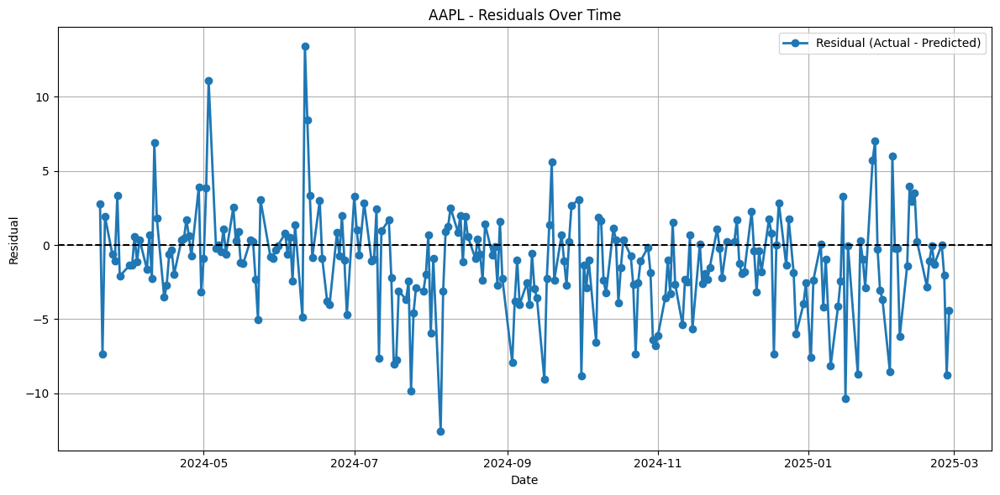

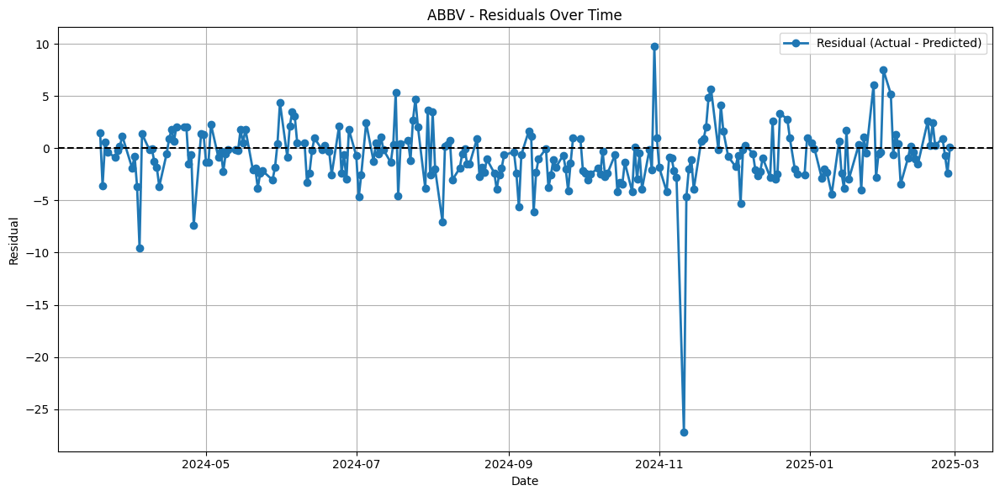

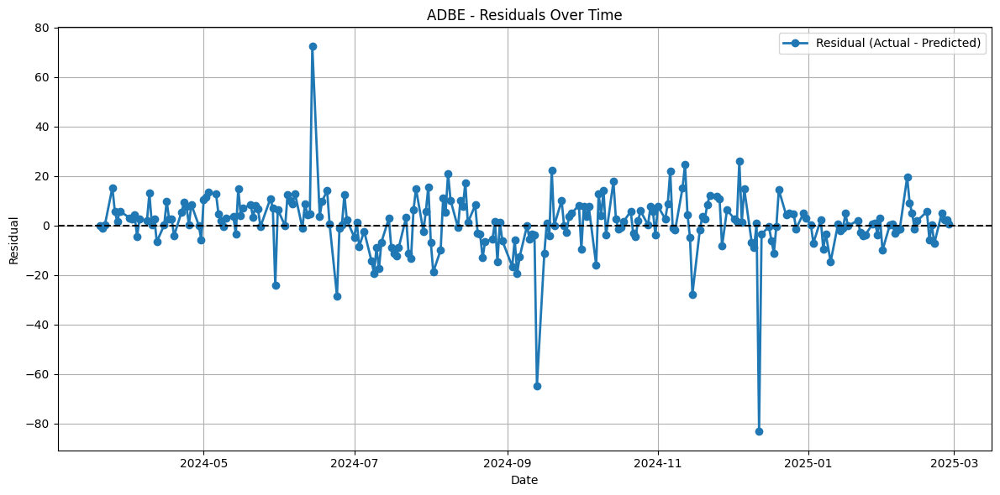

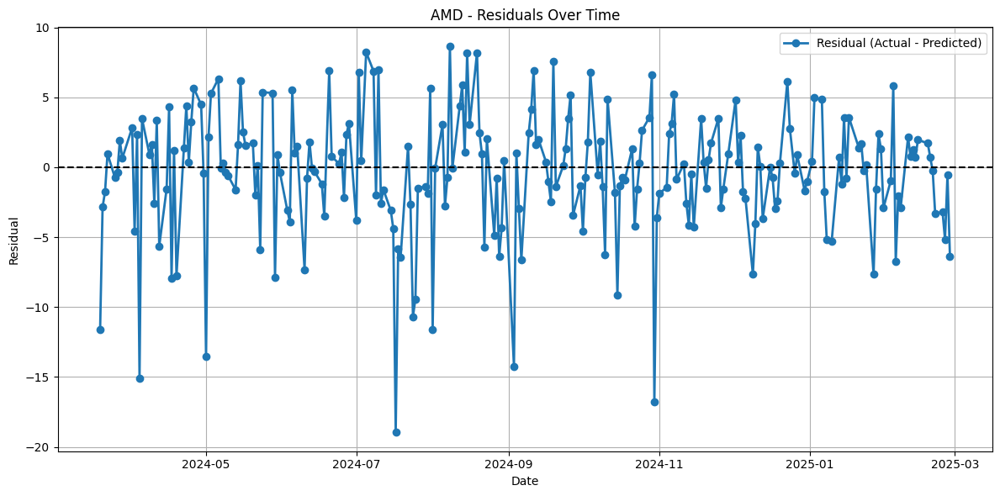

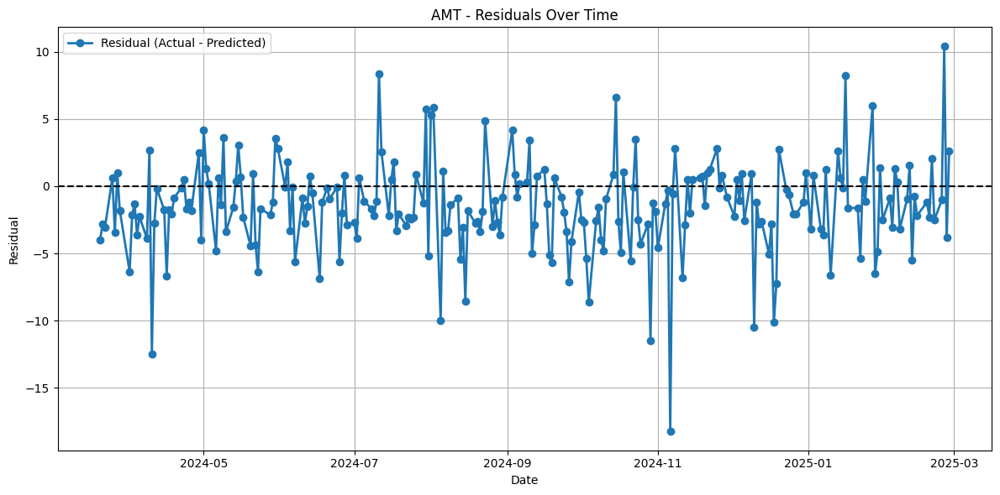

...

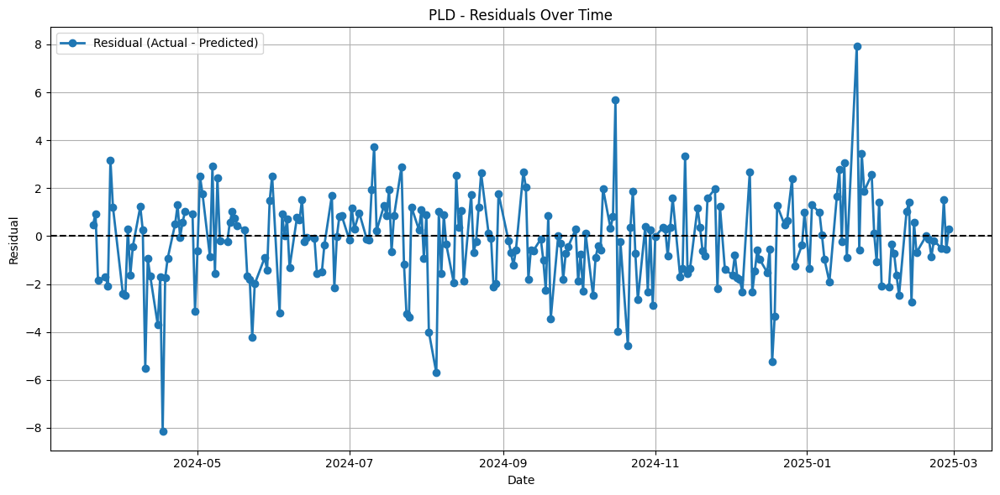

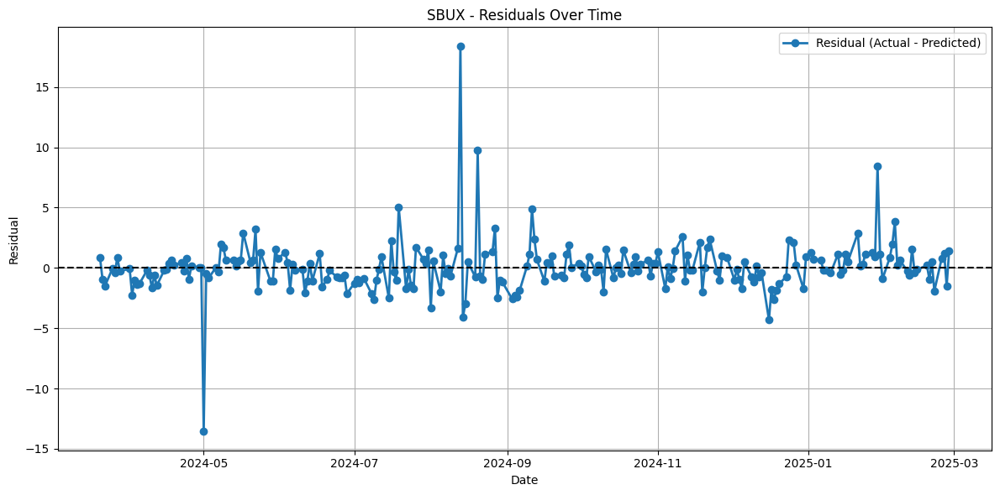

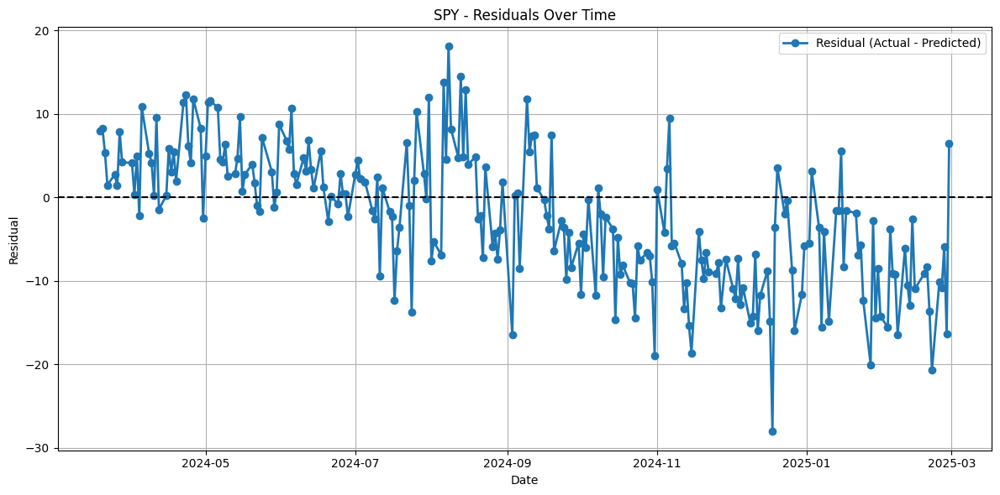

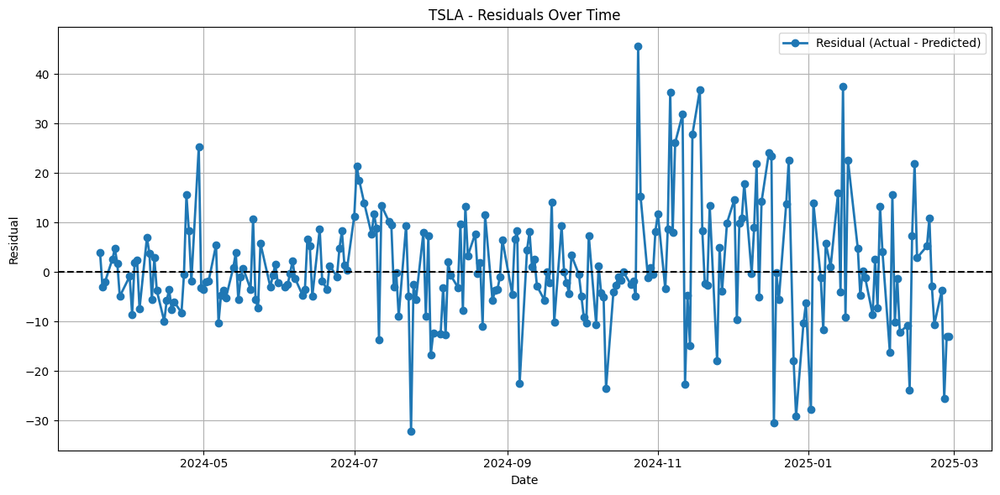

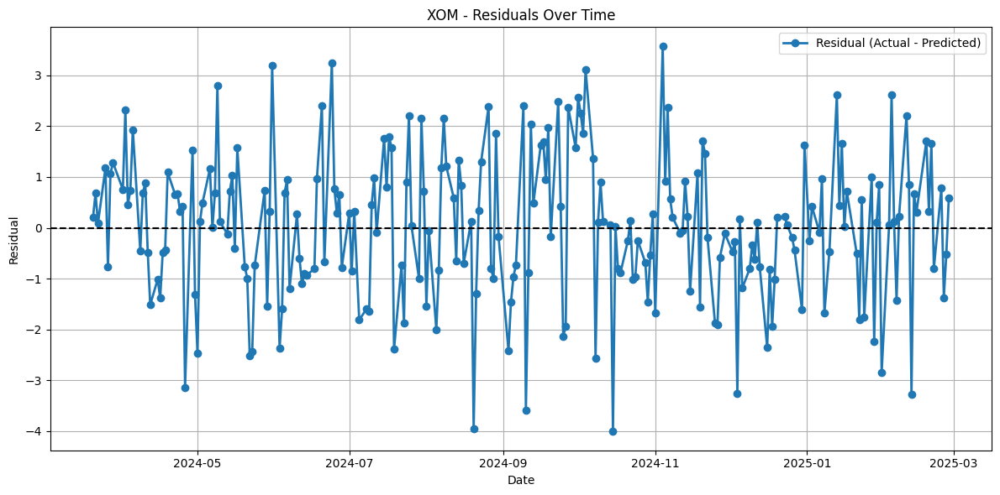

In [31]:
# Add a column for residuals in your DataFrame.
df_results["Residual"] = df_results["Actual"] - df_results["Predicted"]

# Plot residuals over time for each ticker in a grid (example for one ticker).
for ticker in unique_tickers:
    df_ticker = df_results[df_results["Ticker"] == ticker].sort_values("Date")
    
    plt.figure(figsize=(12, 6))
    plt.plot(df_ticker["Date"], df_ticker["Residual"], label="Residual (Actual - Predicted)", marker="o", linewidth=2)
    plt.axhline(0, color="black", linestyle="--", linewidth=1.5)
    plt.title(f"{ticker} - Residuals Over Time")
    plt.xlabel("Date")
    plt.ylabel("Residual")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [33]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, max_error

# Function to compute MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    # Replace zeros in y_true to avoid division by zero
    y_true = np.where(y_true == 0, 1, y_true)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Assume df_results DataFrame is already created containing "Date", "Ticker", "Actual" and "Predicted"
unique_tickers = df_results["Ticker"].unique()

# Initialize a list to gather error metrics per ticker.
error_data = []

# Loop over each ticker to calculate error metrics.
for ticker in unique_tickers:
    # Filter data by ticker and sort by Date
    df_ticker = df_results[df_results["Ticker"] == ticker].sort_values(by="Date")
    
    # Calculate error metrics
    mae = mean_absolute_error(df_ticker["Actual"], df_ticker["Predicted"])
    mse = mean_squared_error(df_ticker["Actual"], df_ticker["Predicted"])
    rmse = np.sqrt(mse)
    max_err = max_error(df_ticker["Actual"], df_ticker["Predicted"])
    mape = mean_absolute_percentage_error(df_ticker["Actual"].values, df_ticker["Predicted"].values)
    
    # Append the results as a dictionary
    error_data.append({
        "Ticker": ticker,
        "MAE": mae,
        "RMSE": rmse,
        "Max Error": max_err,
        "MAPE (%)": mape
    })

# Convert the error metrics list to a DataFrame
error_table = pd.DataFrame(error_data)

# Format the table for display (optional formatting for better readability)
error_table = error_table.set_index("Ticker").round(2)
print("Error Metrics by Stock")
print(error_table)

# Optionally, if you want to export to CSV:
error_table.to_csv("stock_error_metrics.csv")


Error Metrics by Stock
          MAE   RMSE  Max Error  MAPE (%)
Ticker                                   
AAPL     2.63   3.64      13.40      1.22
ABBV     2.09   3.13      27.19      1.19
ADBE     7.51  12.11      83.08      1.49
AMD      3.23   4.45      18.93      2.20
AMT      2.79   3.74      18.23      1.40
AMZN     2.95   3.85      16.41      1.51
BA       2.74   3.60      15.09      1.62
BAC      0.50   0.68       3.53      1.21
BLK     72.60  98.54     211.21      7.39
CAT      5.10   6.95      37.33      1.41
COP      1.27   1.66       6.63      1.17
CRM      4.17   6.81      55.62      1.46
CVX      1.50   1.99       8.00      1.00
DUK      0.92   1.17       4.03      0.86
FCX      0.80   1.07       3.96      1.75
GOOGL    2.37   3.36      16.98      1.36
GS       7.98  11.07      70.46      1.54
HD       4.57   5.66      17.49      1.22
HON      2.35   3.10      13.83      1.13
JNJ      1.30   1.69       5.40      0.86
JPM      2.59   3.81      23.06      1.20
LIN      3.

In [35]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, max_error, r2_score

# -------------------------------
# Helper Functions
# -------------------------------
def mean_absolute_percentage_error(y_true, y_pred):
    # Replace zeros in y_true to avoid division by zero.
    y_true = np.where(y_true == 0, 1, y_true)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def symmetric_mean_absolute_percentage_error(y_true, y_pred):
    denominator = np.abs(y_true) + np.abs(y_pred)
    denominator = np.where(denominator == 0, 1, denominator)
    return np.mean(2 * np.abs(y_true - y_pred) / denominator) * 100

def directional_accuracy(actual, predicted):
    """Calculates percentage of day-to-day movements with the same direction."""
    actual_diff = np.diff(actual)
    predicted_diff = np.diff(predicted)
    if len(actual_diff) == 0:
        return np.nan
    correct = np.sum(np.sign(actual_diff) == np.sign(predicted_diff))
    return (correct / len(actual_diff)) * 100

def compute_sharpe_ratio(series):
    """Compute a simple daily Sharpe ratio (mean daily return divided by volatility)."""
    returns = pd.Series(series).pct_change().dropna()
    if returns.std() == 0:
        return np.nan
    return returns.mean() / returns.std()

def max_drawdown(series):
    """Compute the maximum drawdown (%) from a price series."""
    series = pd.Series(series)
    cumulative = series.cummax()
    drawdown = (series - cumulative) / cumulative
    return drawdown.min() * 100  # expressed as a percentage (will be negative)

# -------------------------------
# Compute All Metrics per Stock
# -------------------------------
# Ensure df_results has been prepared with "Date", "Ticker", "Actual" and "Predicted"
df_results["Date"] = pd.to_datetime(df_results["Date"])
df_results = df_results.sort_values(["Ticker", "Date"])
unique_tickers = df_results["Ticker"].unique()

all_metrics = []
for ticker in unique_tickers:
    df_ticker = df_results[df_results["Ticker"] == ticker].sort_values("Date")
    actual = df_ticker["Actual"].values
    predicted = df_ticker["Predicted"].values
    
    # Overall Regression Metrics
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    median_ae = np.median(np.abs(actual - predicted))
    max_err = max_error(actual, predicted)
    mape = mean_absolute_percentage_error(actual, predicted)
    smape = symmetric_mean_absolute_percentage_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    
    # Directional Accuracy
    dir_acc = directional_accuracy(actual, predicted)
    
    # Sharpe Ratio and Maximum Drawdown
    sharpe_actual = compute_sharpe_ratio(actual)
    sharpe_predicted = compute_sharpe_ratio(predicted)
    maxdd_actual = max_drawdown(actual)
    maxdd_predicted = max_drawdown(predicted)
    
    # Temporal Segmentation: First half vs. Second half
    n = len(actual)
    half = n // 2 if n > 1 else 1
    mae_first_half = mean_absolute_error(actual[:half], predicted[:half])
    mape_first_half = mean_absolute_percentage_error(actual[:half], predicted[:half])
    mae_second_half = mean_absolute_error(actual[half:], predicted[half:])
    mape_second_half = mean_absolute_percentage_error(actual[half:], predicted[half:])
    
    # Volatility-Based Metrics: Using the absolute daily percentage change as proxy
    pct_change = np.abs(np.diff(actual))
    median_vol = np.median(pct_change) if len(pct_change) > 0 else 0
    # Align index: prepend False for the first day (no percentage change)
    high_vol_idx = np.where(np.concatenate(([False], pct_change > median_vol)))[0]
    low_vol_idx = np.where(np.concatenate(([False], pct_change <= median_vol)))[0]
    if len(high_vol_idx) > 1:
        mae_high_vol = mean_absolute_error(actual[high_vol_idx], predicted[high_vol_idx])
        mape_high_vol = mean_absolute_percentage_error(actual[high_vol_idx], predicted[high_vol_idx])
    else:
        mae_high_vol, mape_high_vol = np.nan, np.nan
        
    if len(low_vol_idx) > 1:
        mae_low_vol = mean_absolute_error(actual[low_vol_idx], predicted[low_vol_idx])
        mape_low_vol = mean_absolute_percentage_error(actual[low_vol_idx], predicted[low_vol_idx])
    else:
        mae_low_vol, mape_low_vol = np.nan, np.nan

    # Movement-Based Metrics: Upward vs. Downward movement days
    actual_diff = np.diff(actual)
    # Prepend False for first day (no movement)
    upward_idx = np.where(np.concatenate(([False], actual_diff > 0)))[0]
    downward_idx = np.where(np.concatenate(([False], actual_diff < 0)))[0]
    
    if len(upward_idx) > 1:
        mae_upward = mean_absolute_error(actual[upward_idx], predicted[upward_idx])
        mape_upward = mean_absolute_percentage_error(actual[upward_idx], predicted[upward_idx])
    else:
        mae_upward, mape_upward = np.nan, np.nan
        
    if len(downward_idx) > 1:
        mae_downward = mean_absolute_error(actual[downward_idx], predicted[downward_idx])
        mape_downward = mean_absolute_percentage_error(actual[downward_idx], predicted[downward_idx])
    else:
        mae_downward, mape_downward = np.nan, np.nan
    
    all_metrics.append({
        "Ticker": ticker,
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "Median AE": median_ae,
        "Max Error": max_err,
        "MAPE (%)": mape,
        "sMAPE (%)": smape,
        "R²": r2,
        "Directional Accuracy (%)": dir_acc,
        "Actual Sharpe": sharpe_actual,
        "Predicted Sharpe": sharpe_predicted,
        "Actual Max Drawdown (%)": maxdd_actual,
        "Predicted Max Drawdown (%)": maxdd_predicted,
        "Temporal First Half MAE": mae_first_half,
        "Temporal First Half MAPE (%)": mape_first_half,
        "Temporal Second Half MAE": mae_second_half,
        "Temporal Second Half MAPE (%)": mape_second_half,
        "High Volatility MAE": mae_high_vol,
        "High Volatility MAPE (%)": mape_high_vol,
        "Low Volatility MAE": mae_low_vol,
        "Low Volatility MAPE (%)": mape_low_vol,
        "Upward Movement MAE": mae_upward,
        "Upward Movement MAPE (%)": mape_upward,
        "Downward Movement MAE": mae_downward,
        "Downward Movement MAPE (%)": mape_downward
    })

# Convert collected metrics into a DataFrame and format for display.
df_metrics = pd.DataFrame(all_metrics)
df_metrics = df_metrics.set_index("Ticker").round(4)
print("Per Stock Metrics:")
print(df_metrics)



Per Stock Metrics:
            MAE        MSE     RMSE  Median AE  Max Error  MAPE (%)  \
Ticker                                                                
AAPL     2.6335    13.2284   3.6371     1.9400    13.3996    1.2162   
ABBV     2.0901     9.7765   3.1267     1.7958    27.1893    1.1874   
ADBE     7.5106   146.7273  12.1131     4.9951    83.0794    1.4905   
AMD      3.2253    19.7612   4.4454     2.2774    18.9287    2.2036   
AMT      2.7850    14.0188   3.7442     2.1904    18.2316    1.4018   
AMZN     2.9504    14.7949   3.8464     2.3955    16.4098    1.5119   
BA       2.7379    12.9496   3.5986     2.2355    15.0905    1.6195   
BAC      0.4983     0.4592   0.6776     0.3847     3.5302    1.2132   
BLK     72.5982  9710.8118  98.5435    33.6871   211.2131    7.3933   
CAT      5.1043    48.3481   6.9533     3.8108    37.3269    1.4101   
COP      1.2652     2.7421   1.6559     1.0128     6.6297    1.1696   
CRM      4.1659    46.3135   6.8054     2.9445    55.6248 

In [39]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Load your data into df (if not already loaded)
# df = pd.read_csv("your_data.csv")

# -------------------------------
# 1. Correlation Heatmap for All Features
# -------------------------------
plt.figure(figsize=(12, 10))
# Compute the correlation matrix for all columns
corr_matrix = X_test.corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Heatmap: All Features")
plt.tight_layout()
plt.show()

# -------------------------------
# 2. Correlation Heatmap for Top 10 Features Most Correlated with the Target
# -------------------------------
# Compute the absolute correlation values with the target variable
corr_target = corr_matrix["target"].abs().sort_values(ascending=False)

# Exclude the target variable itself and take the next top 10 features
top_features = corr_target.index[1:11]  # index 0 is 'target' itself
selected_features = list(top_features) + ["target"]

# Compute correlation matrix for these features
top_corr_matrix = df[selected_features].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(top_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Heatmap: Top 10 Features most Correlated with Target")
plt.tight_layout()
plt.show()


AttributeError: 'numpy.ndarray' object has no attribute 'corr'

<Figure size 1200x1000 with 0 Axes>

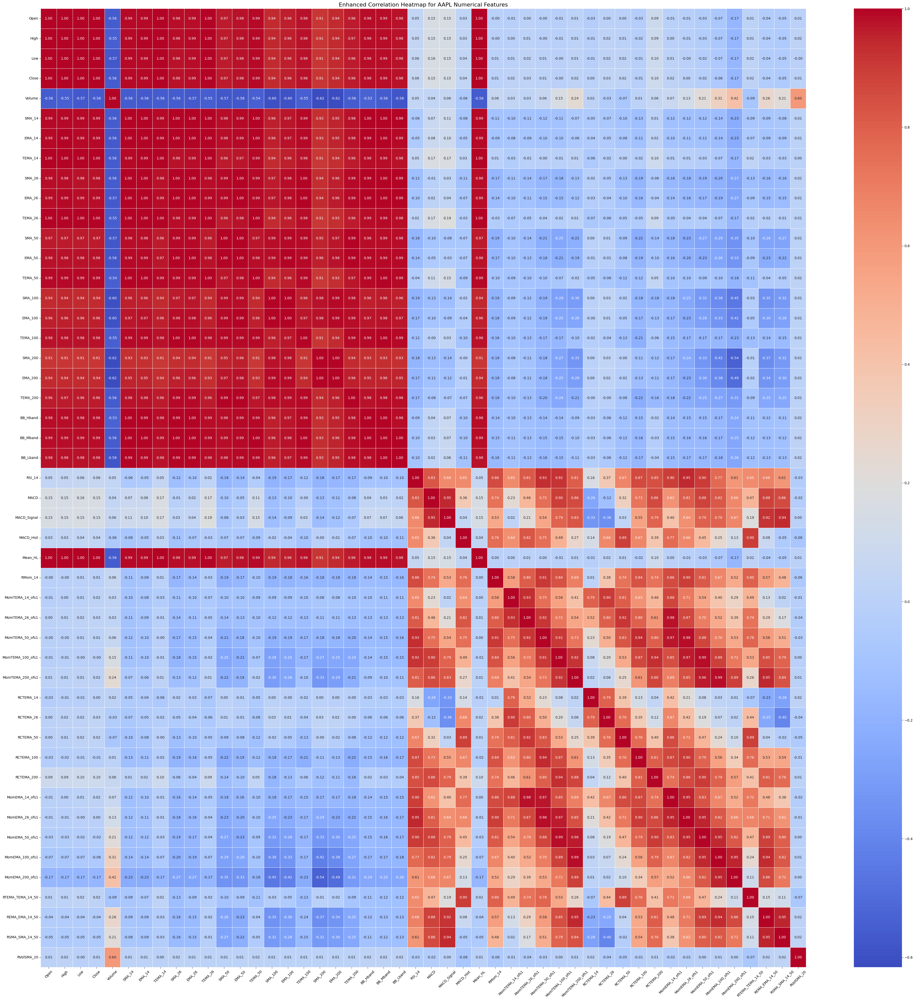

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load AAPL CSV
file_to_visualize = "./filtered_data_lstmgru/AAPL.csv"
try:
    df = pd.read_csv(file_to_visualize)
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")
    df.sort_values("Date", inplace=True)
    ticker_name = "AAPL"
except FileNotFoundError:
    print("AAPL.csv file not found in the ./filtered_data_lstmgru2 directory.")
    raise

# ===== Visualization 1: Enhanced Correlation Heatmap =====

# Compute correlation for all numerical features
numeric_cols = df.select_dtypes(include=[np.number])
corr = numeric_cols.corr()



plt.figure(figsize=(40, 40))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Enhanced Correlation Heatmap for AAPL Numerical Features", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


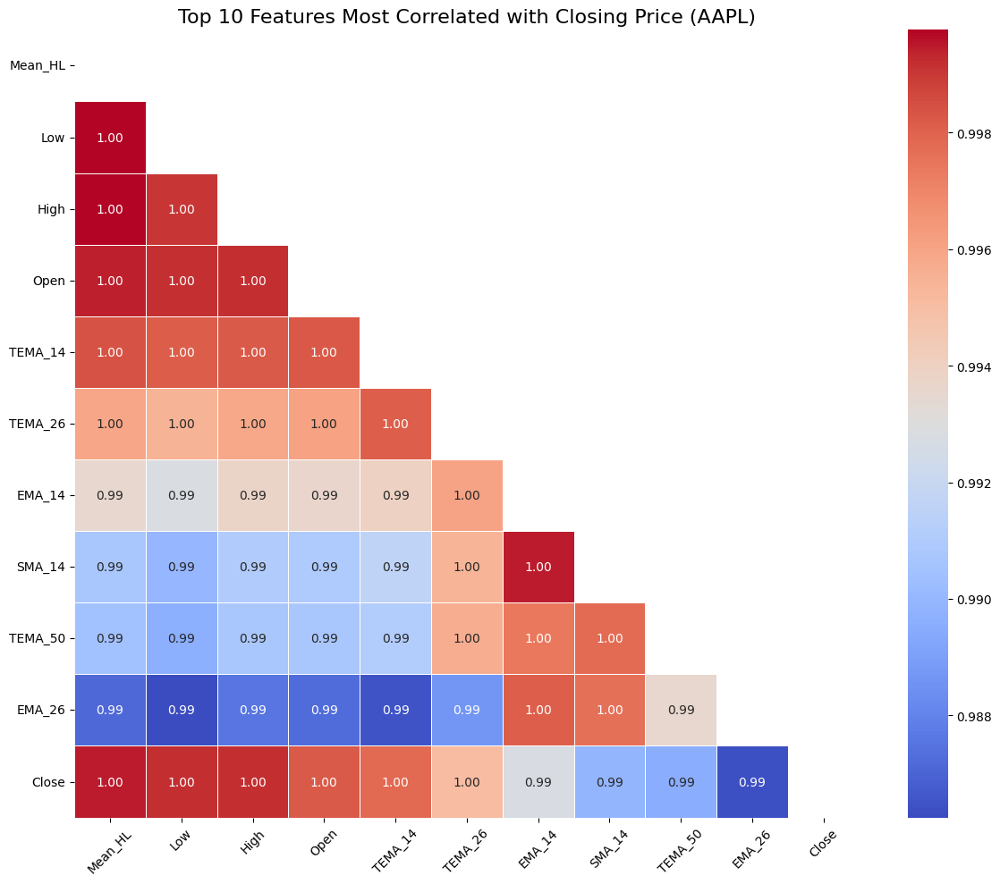

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load AAPL CSV
file_to_visualize = "./filtered_data_lstmgru/AAPL.csv"
try:
    df = pd.read_csv(file_to_visualize)
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")
    df.sort_values("Date", inplace=True)
    ticker_name = "AAPL"
except FileNotFoundError:
    print("AAPL.csv file not found in the ./filtered_data_lstmgru2 directory.")
    raise

# ===== Visualization: Top 10 Features Most Correlated with Closing Price =====

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate correlations with 'Close' column
correlations_with_close = numeric_df.corr()["Close"].drop("Close")

# Get top 10 most correlated features (by absolute correlation)
top_10_features = correlations_with_close.abs().sort_values(ascending=False).head(10).index.tolist()

# Include 'Close' in the final list
features_to_plot = top_10_features + ["Close"]

# Compute the correlation matrix for selected features
corr_subset = numeric_df[features_to_plot].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_subset, dtype=bool))

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_subset, mask=mask, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Top 10 Features Most Correlated with Closing Price (AAPL)", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


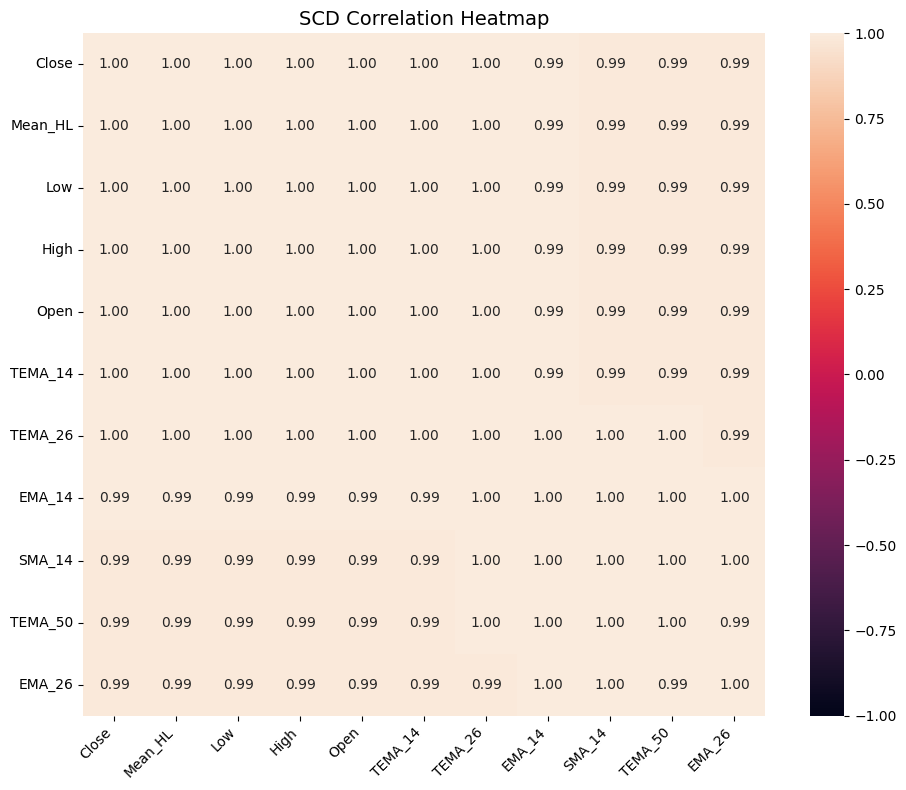

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load AAPL CSV
file_to_visualize = "./filtered_data_lstmgru/AAPL.csv"
try:
    df = pd.read_csv(file_to_visualize)
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")
    df.sort_values("Date", inplace=True)
    ticker_name = "AAPL"
except FileNotFoundError:
    print("AAPL.csv file not found in the ./filtered_data_lstmgru2 directory.")
    raise

# ===== Final Correlation Heatmap Style: Top 10 Features Most Correlated with Close =====

# Get only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate correlation with 'Close'
corr_with_close = numeric_df.corr()["Close"].drop("Close")
top_10 = corr_with_close.abs().sort_values(ascending=False).head(10).index.tolist()

# Include 'Close' in final selection
selected_features = ["Close"] + top_10

# Subset and compute correlation matrix
corr_matrix = numeric_df[selected_features].corr()

# Plot full heatmap (no masking)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="rocket", vmin=-1, vmax=1, square=True, cbar=True)

plt.title("SCD Correlation Heatmap", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


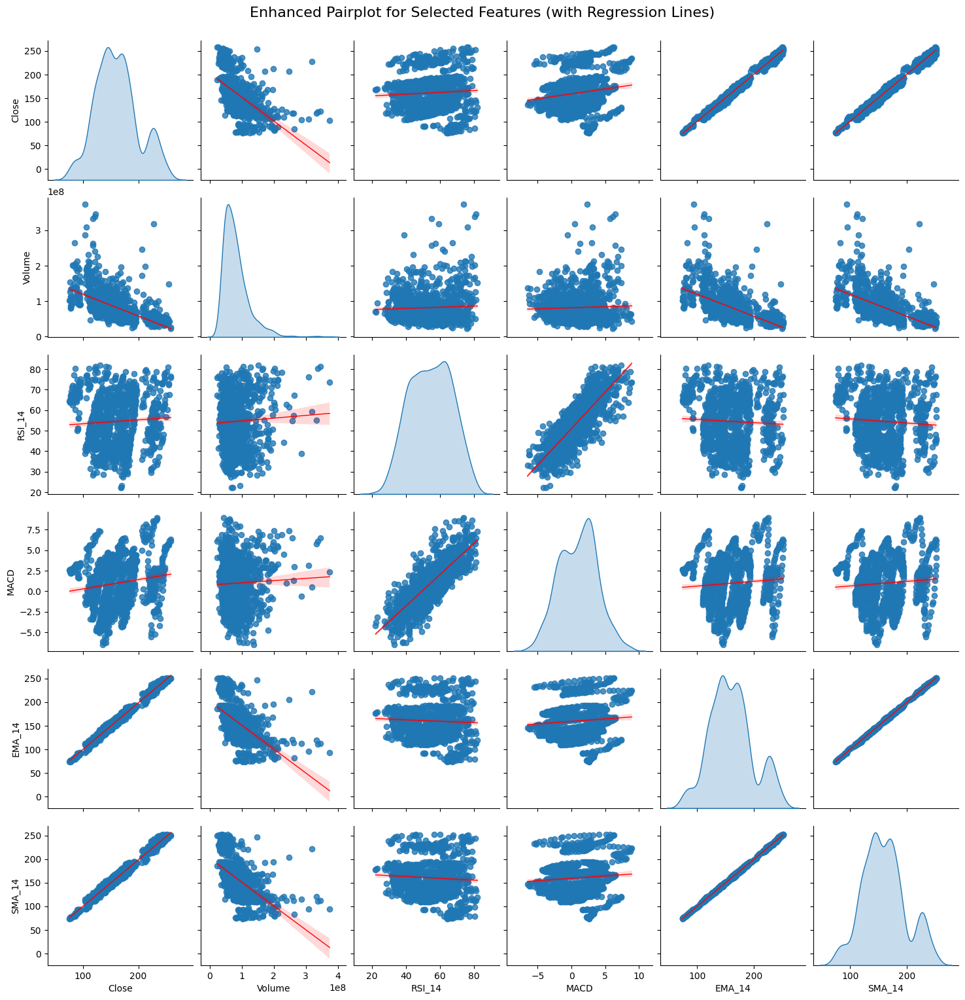

In [54]:
# ===== Visualization 2: Improved Pairplot for Selected Features =====

# Select a subset of features for analysis
selected_features = ["Close", "Volume", "RSI_14", "MACD", "EMA_14", "SMA_14"]
if set(selected_features).issubset(df.columns):
    sns.pairplot(df[selected_features], kind="reg", diag_kind="kde",
                 plot_kws={"line_kws": {"color": "red", "lw": 1}})
    plt.suptitle("Enhanced Pairplot for Selected Features (with Regression Lines)", 
                 y=1.02, fontsize=16)
    plt.show()
else:
    print("Some of the selected features are not present in the AAPL dataset.")



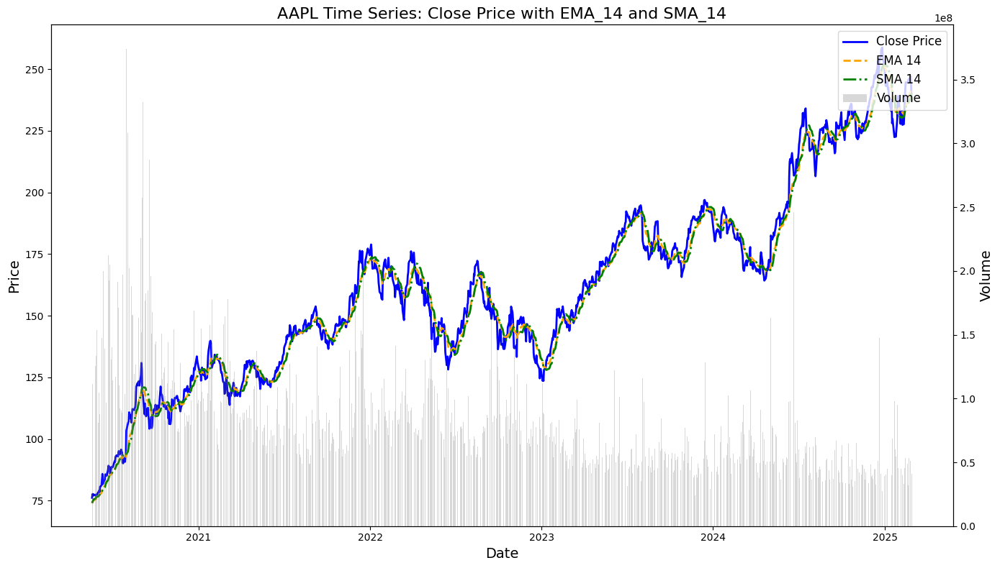

In [55]:
# ===== Visualization 3: Time Series and Trend Analysis =====

fig, ax1 = plt.subplots(figsize=(14, 8))
ax1.plot(df["Date"], df["Close"], label="Close Price", color="blue", linewidth=2)
if "EMA_14" in df.columns:
    ax1.plot(df["Date"], df["EMA_14"], label="EMA 14", color="orange", linestyle="--", linewidth=2)
if "SMA_14" in df.columns:
    ax1.plot(df["Date"], df["SMA_14"], label="SMA 14", color="green", linestyle="-.", linewidth=2)
ax1.set_xlabel("Date", fontsize=14)
ax1.set_ylabel("Price", fontsize=14)
ax1.legend(loc="upper left")
ax1.set_title("AAPL Time Series: Close Price with EMA_14 and SMA_14", fontsize=16)

# Secondary axis for Volume
ax2 = ax1.twinx()
if "Volume" in df.columns:
    ax2.bar(df["Date"], df["Volume"], alpha=0.3, label="Volume", color="grey")
    ax2.set_ylabel("Volume", fontsize=14)
    # Combine legends from both axes
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc="upper right", fontsize=12)
plt.tight_layout()
plt.show()

# ===== Visualization 4: Enhanced Residual Analysis on Model Predictions =====

In [56]:
# ----- Visualization 4: Enhanced Residual Analysis on Model Predictions (Test Data) -----
# This section assumes that your model predictions and actual values for test data 
# have been computed as y_new_pred and y_new respectively.
if 'y_new' in globals() and 'y_new_pred' in globals():
    residuals = y_new - y_new_pred

    # Check if statsmodels is installed to enable LOWESS regression in regplot
    try:
        import statsmodels.api as sm  # Required for lowess functionality
        lowess_enabled = True
    except ImportError:
        print("Statsmodels not installed. LOWESS regression will be disabled.")
        lowess_enabled = False

    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=y_new_pred, y=residuals, alpha=0.7, color="purple")
    sns.regplot(x=y_new_pred, y=residuals, scatter=False, lowess=lowess_enabled,
                line_kws={"color": "black", "lw": 2})
    plt.axhline(0, color="red", linestyle="--", lw=2)
    plt.xlabel("Predicted Close Price", fontsize=14)
    plt.ylabel("Residuals (Actual - Predicted)", fontsize=14)
    plt.title("Enhanced Residual Plot for AAPL Test Data", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Histogram of residuals with KDE for distribution analysis
    plt.figure(figsize=(12, 6))
    sns.histplot(residuals, kde=True, bins=30, color="teal")
    plt.xlabel("Residuals", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.title("Enhanced Distribution of Residuals (Test Data)", fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("Model predictions (y_new_pred) and/or actual values (y_new) are not defined in the global namespace.")


Model predictions (y_new_pred) and/or actual values (y_new) are not defined in the global namespace.


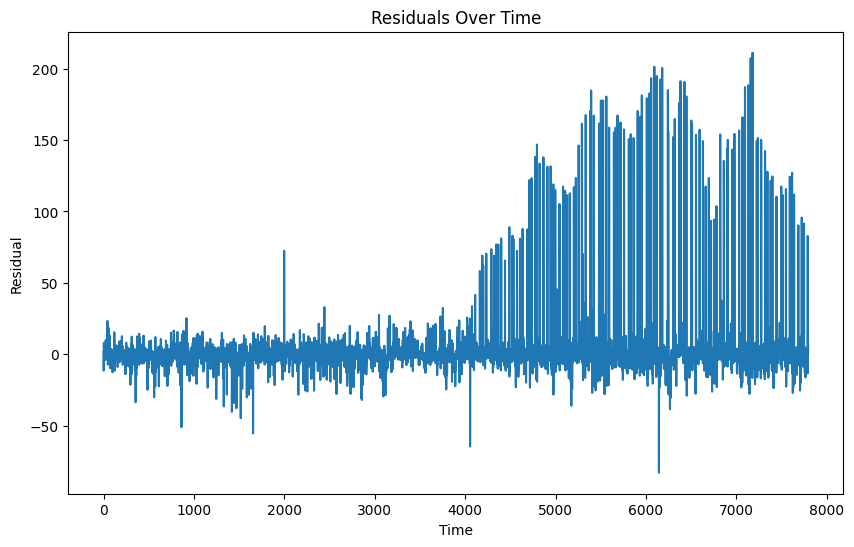

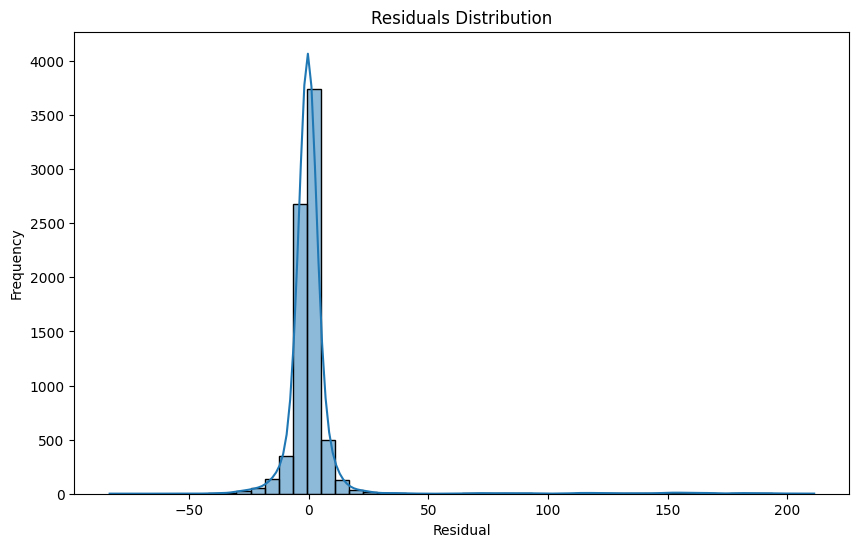

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

residuals = y_test - y_pred

# Residuals over time
plt.figure(figsize=(10, 6))
plt.plot(residuals)
plt.title('Residuals Over Time')
plt.xlabel('Time')
plt.ylabel('Residual')
plt.show()

# Residuals histogram
plt.figure(figsize=(10, 6))
sns.histplot(residuals, bins=50, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()


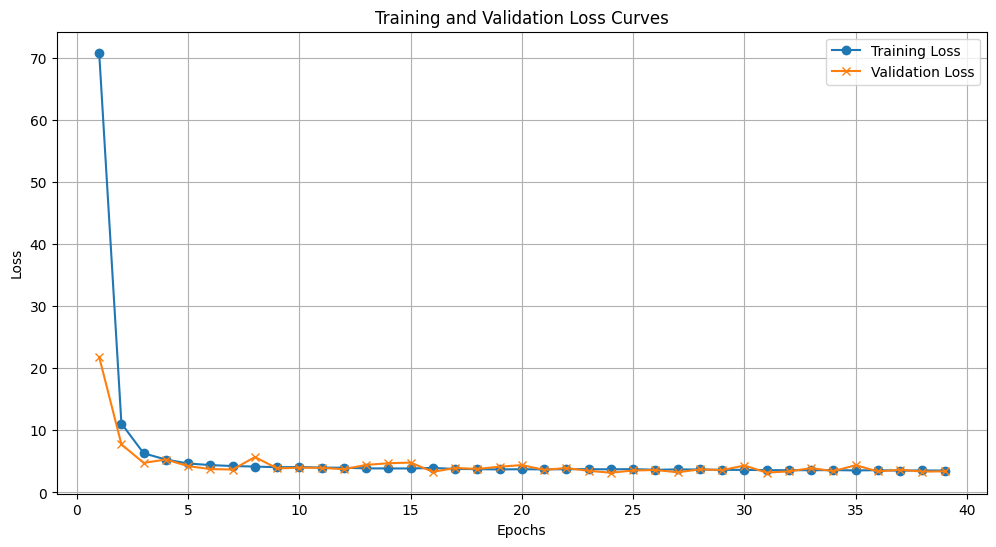

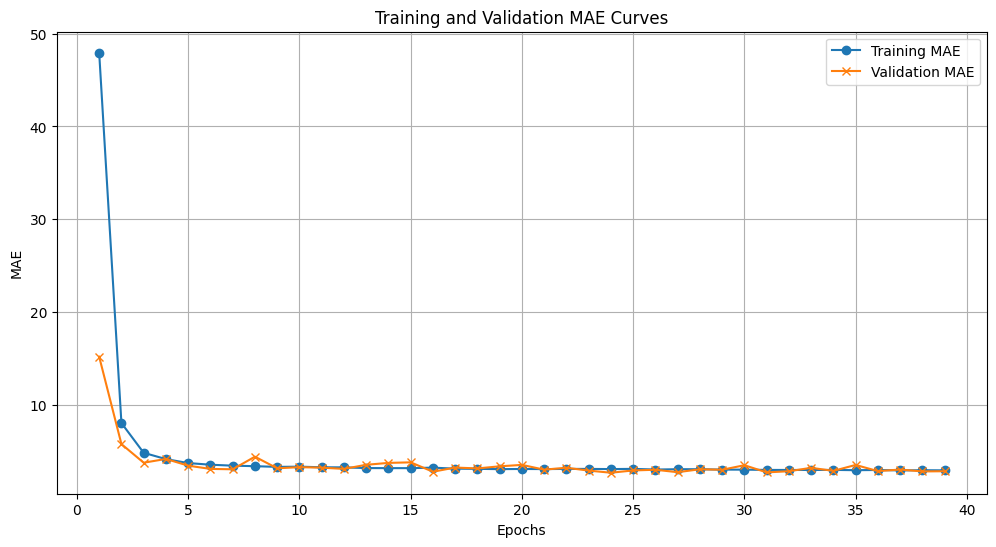

Epoch Timing and Metrics:
    Epoch  Training Time (s)       Loss  Validation Loss        MAE  \
0       1         201.098505  70.848183        21.823261  47.939167   
1       2         159.809998  11.098030         7.746586   8.066782   
2       3         153.642090   6.305364         4.751427   4.861577   
3       4         153.956456   5.292910         5.301350   4.181778   
4       5         165.099487   4.659301         4.228651   3.755525   
5       6         159.712342   4.403282         3.756610   3.578220   
6       7         200.876739   4.247823         3.686196   3.475470   
7       8         205.570101   4.167278         5.700467   3.420343   
8       9         109.989052   4.055044         3.867357   3.343579   
9      10          68.124407   4.093532         3.984100   3.367618   
10     11          65.036509   3.996192         3.958510   3.302519   
11     12          80.078781   3.978505         3.732610   3.291562   
12     13          65.117753   3.875115         4.4

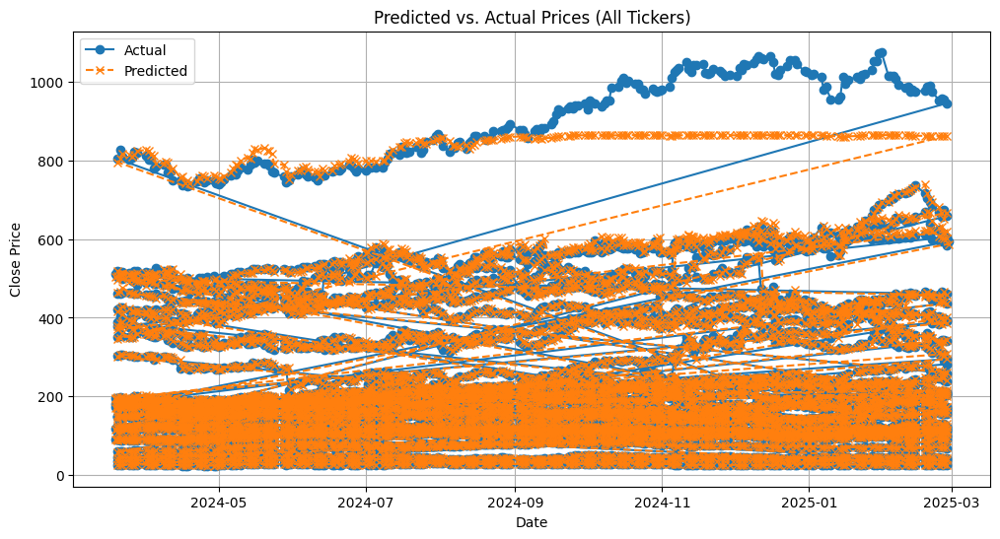

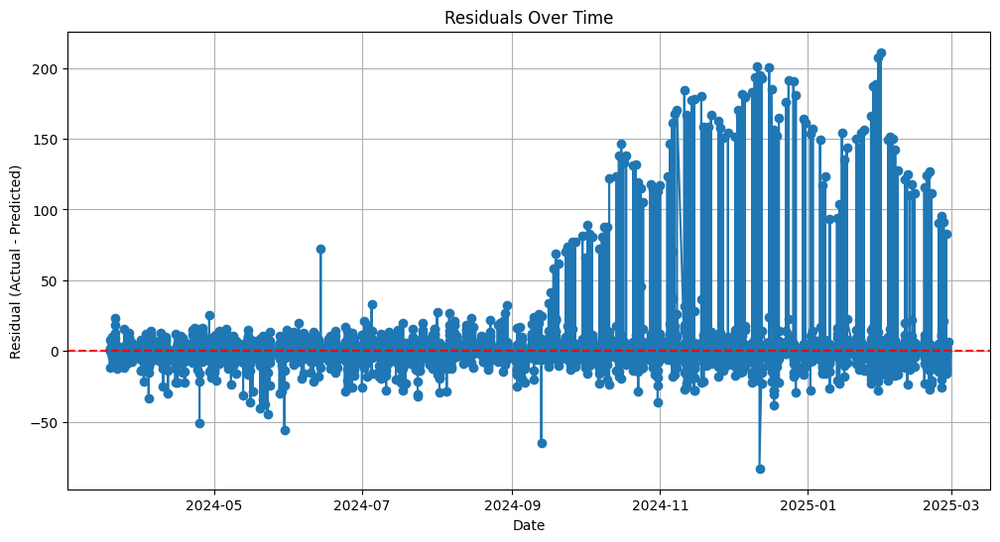

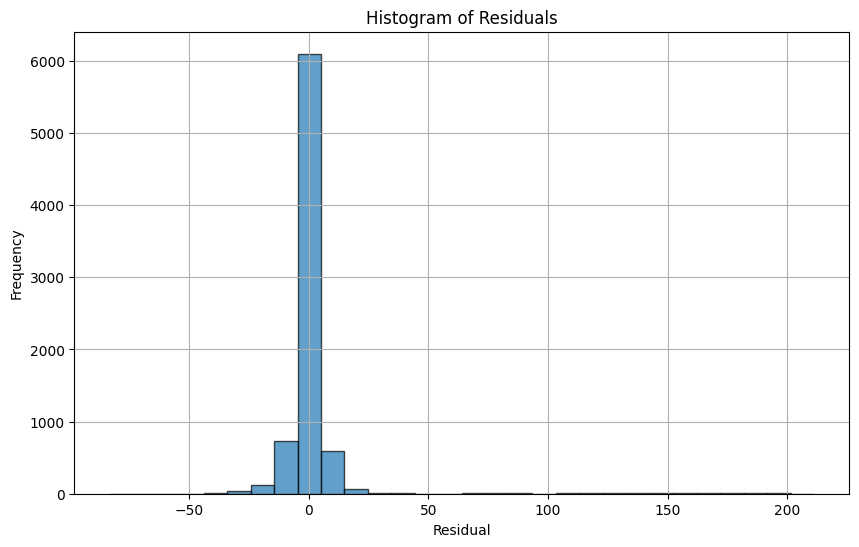

Model Performance Metrics:
     Ticker        MAE          MSE        R²   Max Error  MAPE (%)
0   Overall   5.305634   323.640564  0.991325  211.213074  1.638178
1      AAPL   2.633548    13.228350  0.977833   13.399551  1.216174
2      ABBV   2.090130     9.776488  0.947266   27.189270  1.187445
3      ADBE   7.510577   146.727270  0.920513   83.079407  1.490521
4       AMD   3.225264    19.761211  0.948735   18.928711  2.203611
5       AMT   2.785044    14.018795  0.958244   18.231567  1.401801
6      AMZN   2.950380    14.794937  0.962279   16.409775  1.511940
7        BA   2.737858    12.949617  0.922352   15.090469  1.619524
8       BAC   0.498257     0.459152  0.964937    3.530205  1.213229
9       BLK  72.598191  9710.811789  0.145176  211.213074  7.393306
10      CAT   5.104329    48.348114  0.918326   37.326935  1.410085
11      COP   1.265233     2.742084  0.961408    6.629730  1.169562
12      CRM   4.165851    46.313472  0.964871   55.624802  1.461281
13      CVX   1.49739

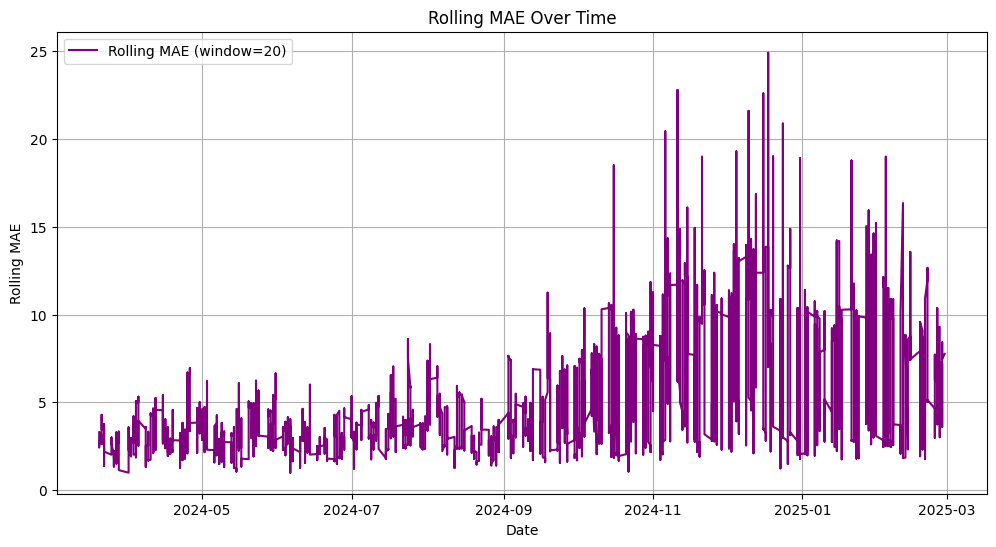

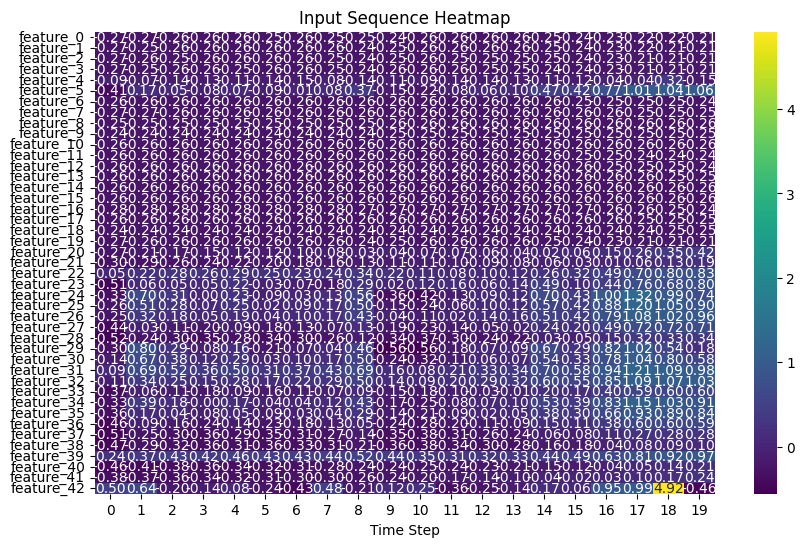

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


IndexError: Inconsistent shape between the condition and the input (got (64, 1) and (64,))

<Figure size 1200x600 with 0 Axes>